In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [8]:
correct_sample  = [] 
with open('FullCorrectPredictedSample.txt', 'r') as f:
    correct_sample  = f.readlines()

In [12]:
correct_sample_ = []
for ele in correct_sample:
    correct_sample_.append(ele[:-1])


In [56]:
len(correct_sample_)

64

In [14]:
highspe_sample  = [] 
with open('HighSpePredictectedSamples.txt', 'r') as f:
    highspe_sample  = f.readlines()
highspe_sample_ = []
for ele in highspe_sample:
    highspe_sample_.append(ele[:-1])

In [16]:
Train2SamplesAll = os.listdir('models/research/deeplab/datasets/TumorDetection/dataset/JPEGImages')

In [23]:
sample_train2 = []
for ele in Train2SamplesAll:
    csample = ele.split('_')[0]
    if csample not in sample_train2 and csample.find('TNE') != -1:
        sample_train2.append(csample)

In [39]:
TestSamplesAll = os.listdir('Data/TestImages')

In [47]:

sample_test = []
for ele in TestSamplesAll:
    csample = ele.split('.')[0]
    if csample not in sample_test and csample.find('TNE') != -1:
        sample_test.append(csample)

In [50]:
InterTrainVal = set(sample_test).intersection(set(sample_train2))

In [53]:
len(InterTrainVal)

25

In [52]:
set(highspe_sample_).intersection(set(InterTrainVal))

{'TNE0232', 'TNE1420', 'TNE1425'}

In [54]:
set(correct_sample_).intersection(set(InterTrainVal))

{'TNE0006',
 'TNE0071',
 'TNE0232',
 'TNE0798',
 'TNE0866',
 'TNE0886',
 'TNE0890',
 'TNE1001',
 'TNE1002',
 'TNE1080',
 'TNE1082',
 'TNE1084',
 'TNE1418',
 'TNE1426',
 'TNE1433',
 'TNE1458',
 'TNE2097',
 'TNE2117',
 'TNE2155'}

In [55]:
len(set(correct_sample_).intersection(set(InterTrainVal)))

19

In [58]:
TestOnly = set(sample_test)- set(sample_train2)

In [59]:
len(TestOnly)

284

In [61]:
len(set(TestOnly).intersection(set(correct_sample_)))

45

In [62]:
len(set(TestOnly).intersection(set(highspe_sample_)))

84

In [66]:
84 / 284

0.29577464788732394

In [63]:
len(set(TestOnly).intersection(set(highspe_sample_).union(set(correct_sample_))))

129

In [64]:
129 / 284

0.45422535211267606

In [ ]:
TestPredTNE1426 = os.listdir('Data/TestImgPredictionTraining2/TNE1426')
TumorColor = (0,255,255)
NoTumorColor = (192,192,192)
BackgroundColor = (0,0,0)

In [ ]:
 rows = int(math.ceil(len(images) / cols))
    fig = plt.figure()
    fig.set_size_inches(cols * 3, rows * 3)
    for i, (image, title) in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.axis('off')
        plt.imshow(image.astype("uint8"))
        plt.title(title)

In [93]:
TumorMat = np.ones((512,512,3), dtype=np.uint8) 
TumorMat[:,:,0] = 0
TumorMat[:,:,1] = 255
TumorMat[:,:,2] = 255


NoTumorMat = np.ones((512,512,3), dtype=np.uint8) 
NoTumorMat[:,:,0] = 192
NoTumorMat[:,:,1] = 192
NoTumorMat[:,:,2] = 192


BackgroundMat = np.ones((512,512,3), dtype=np.uint8) 
BackgroundMat[:,:,0] = 255
BackgroundMat[:,:,1] = 255
BackgroundMat[:,:,2] = 255


im = cv2.imread('Data/TestImgPredictionTraining2/TNE1426/segmentation/TNE1426_1536_14336-segmap.jpg')
masknorm = np.zeros((im.shape))
dT = np.abs(np.sum(im.astype('int8')  - TumorMat.astype('int8') , axis = 2))
dNT = np.abs(np.sum(im.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
dB = np.abs(np.sum(im.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
diff_mat = np.zeros((im.shape))
diff_mat[:,:,0] = dT
diff_mat[:,:,1] = dNT
diff_mat[:,:,2] = dB
arr2dINDEX = np.argmin(diff_mat, axis = 2)

masknormOri = np.ones((im.shape))
masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                         (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                         (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                         (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
masknorm = masknormT + masknormNT + masknormB
masknorm = np.transpose(masknorm, axes=(1,2,0))




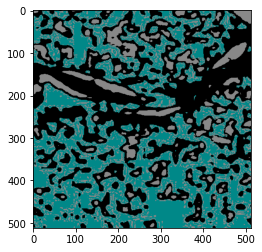

In [94]:
masknorm_m = masknorm*120

plt.imshow(masknorm_m.astype('uint8'))

In [108]:
# Tumor
np.sum(masknorm[:,:, 0] == 0) / (512**2)

0.36354827880859375

In [107]:
(512**2)

262144

In [109]:
# BackGround
np.sum(masknorm[:,:, 0] == 255) / (512**2)

0.22611618041992188

In [110]:
# Np tumor 
np.sum(masknorm[:,:, 0] == 192) / (512**2)

0.4103355407714844

In [ ]:
######################################
#  Generalization
######################################

In [113]:
TumorMat = np.ones((512,512,3), dtype=np.uint8) 
TumorMat[:,:,0] = 0
TumorMat[:,:,1] = 255
TumorMat[:,:,2] = 255


NoTumorMat = np.ones((512,512,3), dtype=np.uint8) 
NoTumorMat[:,:,0] = 192
NoTumorMat[:,:,1] = 192
NoTumorMat[:,:,2] = 192


BackgroundMat = np.ones((512,512,3), dtype=np.uint8) 
BackgroundMat[:,:,0] = 255
BackgroundMat[:,:,1] = 255
BackgroundMat[:,:,2] = 255

list_imgs = os.listdir('Data/TestImgPredictionTraining2/TNE1426/segmentation')
rows = len(list_imgs)
cols = 1
fig = plt.figure()
fig.set_size_inches(cols * 3, rows * 3)
i = 0 
for imname in list_imgs:
    im = cv2.imread(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))
    masknorm = np.zeros((im.shape))
    dT = np.abs(np.sum(im.astype('int8')  - TumorMat.astype('int8') , axis = 2))
    dNT = np.abs(np.sum(im.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
    dB = np.abs(np.sum(im.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
    diff_mat = np.zeros((im.shape))
    diff_mat[:,:,0] = dT
    diff_mat[:,:,1] = dNT
    diff_mat[:,:,2] = dB
    arr2dINDEX = np.argmin(diff_mat, axis = 2)

    masknormOri = np.ones((im.shape))
    masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                             (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
    masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

    masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
    masknorm = masknormT + masknormNT + masknormB
    masknorm = np.transpose(masknorm, axes=(1,2,0))
    pTumor = np.sum(masknorm[:,:, 0] == 0) / (512**2)
    pBackground = np.sum(masknorm[:,:, 0] == 255) / (512**2)
    pNoTumor = np.sum(masknorm[:,:, 0] == 192) / (512**2)
    print('pTumor ', pTumor)
    print('pBackground ', pBackground)
    print('pNoTumor ', pNoTumor)
    title = "T{},NT{},B{}".format(pTumor,pNoTumor,pBackground  )
    plt.subplot(rows, cols, i + 1)
    plt.axis('off')
    plt.imshow(im.astype("uint8"))
    plt.title(title)
    i += 1


pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9993820190429688
pNoTumor  0.00061798095703125
pTumor  0.0
pBackground  0.9999275207519531
pNoTumor  7.2479248046875e-05
pTumor  0.0
pBackground  0.9999809265136719
pNoTumor  1.9073486328125e-05
pTumor  0.0
pBackground  0.9999275207519531
pNoTumor  7.2479248046875e-05
pTumor  0.0
pBackground  0.9997711181640625
pNoTumor  0.0002288818359375
pTumor  0.0
pBackground  0.9914932250976562
pNoTumor  0.00850677490234375
pTumor  0.0
pBackground  0.9999504089355469
pNoTumor  4.9591064453125e-05
pTumor  0.0
pBackground  0.9998512268066406
pNoTumor  0.000148773193359375
pTumor  0.0
pBackground  0.9998703002929688
pNoTumor  0.00012969970703125
pTumor  0.0
pBackground  0.99957275390625
pNoTumor  0.00042724609375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9996261596679688
pNoTumor  0.00037384033203125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998016357421875
pNoTumor  0.000198

pTumor  0.0
pBackground  0.998443603515625
pNoTumor  0.001556396484375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9999313354492188
pNoTumor  6.866455078125e-05
pTumor  0.0
pBackground  0.9999542236328125
pNoTumor  4.57763671875e-05
pTumor  0.0
pBackground  0.9998779296875
pNoTumor  0.0001220703125
pTumor  0.0
pBackground  0.9999885559082031
pNoTumor  1.1444091796875e-05
pTumor  0.0
pBackground  0.9999351501464844
pNoTumor  6.4849853515625e-05
pTumor  0.0
pBackground  0.9999198913574219
pNoTumor  8.0108642578125e-05
pTumor  0.0
pBackground  0.9992866516113281
pNoTumor  0.000713348388671875
pTumor  0.0
pBackground  0.9999809265136719
pNoTumor  1.9073486328125e-05
pTumor  0.0
pBackground  0.9998970031738281
pNoTumor  0.000102996826171875
pTumor  0.0
pBackground  0.9655036926269531
pNoTumor  0.034496307373046875
pTumor  0.0
pBackground  0.564208984375
pNoTumor  0.435791015625
pTumor  0.0
pBackground  0.2644920349121094
p

pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.00057220458984375
pBackground  0.9883384704589844
pNoTumor  0.011089324951171875
pTumor  0.0
pBackground  0.9989242553710938
pNoTumor  0.00107574462890625
pTumor  0.0
pBackground  0.9985427856445312
pNoTumor  0.00145721435546875
pTumor  0.0
pBackground  0.99871826171875
pNoTumor  0.00128173828125
pTumor  0.0
pBackground  0.999176025390625
pNoTumor  0.000823974609375
pTumor  0.0
pBackground  0.9235420227050781
pNoTumor  0.07645797729492188
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9987831115722656
pNoTumor  0.001216888427734375
pTumor  0.0
pBackground  0.7780990600585938
pNoTumor  0.22190093994140625
pTumor  0.0
pBackground  0.4511070251464844
pNoTumor  0.5488929748535156
pTumor  0.01644897460937

pTumor  0.8012428283691406
pBackground  0.096405029296875
pNoTumor  0.10235214233398438
pTumor  0.6538963317871094
pBackground  0.1451568603515625
pNoTumor  0.20094680786132812
pTumor  0.5888938903808594
pBackground  0.15896224975585938
pNoTumor  0.25214385986328125
pTumor  0.5517616271972656
pBackground  0.18065261840820312
pNoTumor  0.26758575439453125
pTumor  0.4990653991699219
pBackground  0.19250106811523438
pNoTumor  0.30843353271484375
pTumor  0.5860633850097656
pBackground  0.18004989624023438
pNoTumor  0.23388671875
pTumor  0.06594085693359375
pBackground  0.8886604309082031
pNoTumor  0.045398712158203125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9999351501464844
pNoTumor  6.4849853515625e-05
pTu

pTumor  0.0416412353515625
pBackground  0.090789794921875
pNoTumor  0.8675689697265625
pTumor  0.3059654235839844
pBackground  0.20692825317382812
pNoTumor  0.4871063232421875
pTumor  0.376007080078125
pBackground  0.17719650268554688
pNoTumor  0.4467964172363281
pTumor  0.45464324951171875
pBackground  0.19596099853515625
pNoTumor  0.349395751953125
pTumor  0.5383186340332031
pBackground  0.1683807373046875
pNoTumor  0.2933006286621094
pTumor  0.6061515808105469
pBackground  0.14890289306640625
pNoTumor  0.24494552612304688
pTumor  0.6844978332519531
pBackground  0.13289260864257812
pNoTumor  0.18260955810546875
pTumor  0.6226997375488281
pBackground  0.1353302001953125
pNoTumor  0.24197006225585938
pTumor  0.6756973266601562
pBackground  0.13246917724609375
pNoTumor  0.19183349609375
pTumor  0.7889251708984375
pBackground  0.10594940185546875
pNoTumor  0.10512542724609375
pTumor  0.6341552734375
pBackground  0.14399337768554688
pNoTumor  0.22185134887695312
pTumor  0.5450553894042969

pTumor  0.0
pBackground  0.4333648681640625
pNoTumor  0.5666351318359375
pTumor  0.0
pBackground  0.4495391845703125
pNoTumor  0.5504608154296875
pTumor  0.0
pBackground  0.5504684448242188
pNoTumor  0.44953155517578125
pTumor  0.0
pBackground  0.44765472412109375
pNoTumor  0.5523452758789062
pTumor  0.0
pBackground  0.4193382263183594
pNoTumor  0.5806617736816406
pTumor  0.0
pBackground  0.15436172485351562
pNoTumor  0.8456382751464844
pTumor  0.0
pBackground  0.14597320556640625
pNoTumor  0.8540267944335938
pTumor  0.0
pBackground  0.142822265625
pNoTumor  0.857177734375
pTumor  0.0
pBackground  0.16724777221679688
pNoTumor  0.8327522277832031
pTumor  0.071136474609375
pBackground  0.11769485473632812
pNoTumor  0.8111686706542969
pTumor  0.36629486083984375
pBackground  0.2246551513671875
pNoTumor  0.40904998779296875
pTumor  0.4453163146972656
pBackground  0.18465805053710938
pNoTumor  0.370025634765625
pTumor  0.42186737060546875
pBackground  0.18684768676757812
pNoTumor  0.3912849

pTumor  0.00016021728515625
pBackground  0.9957618713378906
pNoTumor  0.004077911376953125
pTumor  0.0
pBackground  0.9995574951171875
pNoTumor  0.0004425048828125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998397827148438
pNoTumor  0.00016021728515625
pTumor  0.0
pBackground  0.9996490478515625
pNoTumor  0.0003509521484375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9992828369140625
pNoTumor  0.0007171630859375
pTumor  0.0
pBackground  0.9836463928222656
pNoTumor  0.016353607177734375
pTumor  0.0
pBackground  0.43840789794921875
pNoTumor  0.5615921020507812
pTumor  0.0
pBackground  0.495086669921875
pNoTumor  0.504913330078125
pTumor  0.0
pBackground  0.4965095520019531
pNoTumor  0.5034904479980469
pTumor  0.0
pBackgroun

pTumor  0.45178985595703125
pBackground  0.18175125122070312
pNoTumor  0.3664588928222656
pTumor  0.5051078796386719
pBackground  0.17431259155273438
pNoTumor  0.32057952880859375
pTumor  0.5517387390136719
pBackground  0.16286087036132812
pNoTumor  0.285400390625
pTumor  0.5242538452148438
pBackground  0.16782760620117188
pNoTumor  0.3079185485839844
pTumor  0.4017333984375
pBackground  0.17564010620117188
pNoTumor  0.4226264953613281
pTumor  0.3498954772949219
pBackground  0.168548583984375
pNoTumor  0.4815559387207031
pTumor  0.210052490234375
pBackground  0.15340423583984375
pNoTumor  0.6365432739257812
pTumor  0.2600212097167969
pBackground  0.20491790771484375
pNoTumor  0.5350608825683594
pTumor  0.2934150695800781
pBackground  0.21773147583007812
pNoTumor  0.48885345458984375
pTumor  0.1061859130859375
pBackground  0.7399368286132812
pNoTumor  0.15387725830078125
pTumor  0.0
pBackground  0.9981346130371094
pNoTumor  0.001865386962890625
pTumor  0.0
pBackground  0.998573303222656

pTumor  0.22963714599609375
pBackground  0.18169021606445312
pNoTumor  0.5886726379394531
pTumor  0.3250160217285156
pBackground  0.2136993408203125
pNoTumor  0.4612846374511719
pTumor  0.3489189147949219
pBackground  0.1829681396484375
pNoTumor  0.4681129455566406
pTumor  0.3205604553222656
pBackground  0.16389846801757812
pNoTumor  0.5155410766601562
pTumor  0.30904388427734375
pBackground  0.17006301879882812
pNoTumor  0.5208930969238281
pTumor  0.2192840576171875
pBackground  0.14597702026367188
pNoTumor  0.6347389221191406
pTumor  0.13379669189453125
pBackground  0.16121673583984375
pNoTumor  0.704986572265625
pTumor  0.06508636474609375
pBackground  0.5175590515136719
pNoTumor  0.4173545837402344
pTumor  0.12860107421875
pBackground  0.4740638732910156
pNoTumor  0.3973350524902344
pTumor  0.3120765686035156
pBackground  0.21632003784179688
pNoTumor  0.4716033935546875
pTumor  0.28462982177734375
pBackground  0.19941329956054688
pNoTumor  0.5159568786621094
pTumor  0.2539291381835

pTumor  0.0
pBackground  0.9979896545410156
pNoTumor  0.002010345458984375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9996719360351562
pNoTumor  0.00032806396484375
pTumor  0.0
pBackground  0.656097412109375
pNoTumor  0.343902587890625
pTumor  0.0
pBackground  0.5691299438476562
pNoTumor  0.43087005615234375
pTumor  0.0
pBackground  0.5376815795898438
pNoTumor  0.46231842041015625
pTumor  0.0
pBackground  0.6248283386230469
pNoTumor  0.3751716613769531
pTumor  0.0
pBackground  0.6560211181640625
pNoTumor  0.3439788818359375
pTumor  0.003223419189453125
pBackground  0.4616203308105469
pNoTumor  0.53515625
pTumor  0.014659881591796875
pBackground  0.5168609619140625
pNoTumor  0.4684791564941406
pTumor  0.0
pBackground  0.253387451171875
pNoTumor  0.746612548828125
pTumor  0.0
pBackground  0.3887176513671875
pNoTumor  0.611282348632812

pTumor  0.6393661499023438
pBackground  0.14986038208007812
pNoTumor  0.21077346801757812
pTumor  0.5714035034179688
pBackground  0.23549270629882812
pNoTumor  0.19310379028320312
pTumor  0.002132415771484375
pBackground  0.9861602783203125
pNoTumor  0.011707305908203125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9993019104003906
pNoTumor  0.000698089599609375
pTumor  0.0
pBackground  0.9971199035644531
pNoTumor  0.002880096435546875
pTumor  0.0
pBackground  0.9977569580078125
pNoTumor  0.0022430419921875
pTumor  0.0
pBackground  0.9994354248046875
pNoTumor  0.0005645751953125
pTumor  0.0
pBackground  0.9949760437011719
pNoTumor  0.005023956298828125
pTumor  0.0
pBackground  0.9996376037597656
pNoTumor  0.000362396240234375
pTumor  0.0
pBackground  0.9998817443847656
pNoTumor  0.000118255615234375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTum

pTumor  0.16842269897460938
pBackground  0.155670166015625
pNoTumor  0.6759071350097656
pTumor  0.1849212646484375
pBackground  0.19884109497070312
pNoTumor  0.6162376403808594
pTumor  0.2820587158203125
pBackground  0.17196273803710938
pNoTumor  0.5459785461425781
pTumor  0.4215278625488281
pBackground  0.16139602661132812
pNoTumor  0.41707611083984375
pTumor  0.4850959777832031
pBackground  0.15761566162109375
pNoTumor  0.3572883605957031
pTumor  0.4651451110839844
pBackground  0.16573333740234375
pNoTumor  0.3691215515136719
pTumor  0.3984642028808594
pBackground  0.165069580078125
pNoTumor  0.4364662170410156
pTumor  0.37279510498046875
pBackground  0.16714096069335938
pNoTumor  0.4600639343261719
pTumor  0.3206024169921875
pBackground  0.19183349609375
pNoTumor  0.4875640869140625
pTumor  0.3170814514160156
pBackground  0.3611602783203125
pNoTumor  0.3217582702636719
pTumor  0.18619155883789062
pBackground  0.5380439758300781
pNoTumor  0.27576446533203125
pTumor  0.0
pBackground  

pTumor  0.00148773193359375
pBackground  0.2534942626953125
pNoTumor  0.7450180053710938
pTumor  0.009822845458984375
pBackground  0.5024757385253906
pNoTumor  0.487701416015625
pTumor  0.2377166748046875
pBackground  0.1652984619140625
pNoTumor  0.59698486328125
pTumor  0.3369483947753906
pBackground  0.16660690307617188
pNoTumor  0.4964447021484375
pTumor  0.3784675598144531
pBackground  0.15430831909179688
pNoTumor  0.46722412109375
pTumor  0.27867889404296875
pBackground  0.16392135620117188
pNoTumor  0.5573997497558594
pTumor  0.221160888671875
pBackground  0.14216995239257812
pNoTumor  0.6366691589355469
pTumor  0.23250579833984375
pBackground  0.1531982421875
pNoTumor  0.6142959594726562
pTumor  0.28229522705078125
pBackground  0.14248275756835938
pNoTumor  0.5752220153808594
pTumor  0.3017311096191406
pBackground  0.13477325439453125
pNoTumor  0.5634956359863281
pTumor  0.3257865905761719
pBackground  0.14530181884765625
pNoTumor  0.5289115905761719
pTumor  0.3973655700683594
p

pTumor  0.0
pBackground  0.5797080993652344
pNoTumor  0.4202919006347656
pTumor  0.0
pBackground  0.4881019592285156
pNoTumor  0.5118980407714844
pTumor  0.0
pBackground  0.4217491149902344
pNoTumor  0.5782508850097656
pTumor  0.03081512451171875
pBackground  0.4045829772949219
pNoTumor  0.5646018981933594
pTumor  0.0368499755859375
pBackground  0.33914947509765625
pNoTumor  0.6240005493164062
pTumor  0.3212928771972656
pBackground  0.2779502868652344
pNoTumor  0.4007568359375
pTumor  0.3445472717285156
pBackground  0.18058395385742188
pNoTumor  0.4748687744140625
pTumor  0.3502540588378906
pBackground  0.18253326416015625
pNoTumor  0.4672126770019531
pTumor  0.406005859375
pBackground  0.17515945434570312
pNoTumor  0.4188346862792969
pTumor  0.4841156005859375
pBackground  0.166107177734375
pNoTumor  0.3497772216796875
pTumor  0.43050384521484375
pBackground  0.15424728393554688
pNoTumor  0.4152488708496094
pTumor  0.37592315673828125
pBackground  0.152008056640625
pNoTumor  0.4720687

pTumor  0.0
pBackground  0.9993247985839844
pNoTumor  0.000675201416015625
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998016357421875
pNoTumor  0.0001983642578125
pTumor  0.0
pBackground  0.9999046325683594
pNoTumor  9.5367431640625e-05
pTumor  0.0
pBackground  0.9993133544921875
pNoTumor  0.0006866455078125
pTumor  0.0
pBackground  0.9904708862304688
pNoTumor  0.00952911376953125
pTumor  0.0
pBackground  0.4799690246582031
pNoTumor  0.5200309753417969
pTumor  0.0
pBackground  0.6497573852539062
pNoTumor  0.35024261474609375
pTumor  0.0
pBackground  0.6266288757324219
pNoTumor  0.3733711242675781
pTumor  0.028148651123046875
pBackground  0.22705841064453125
pNoTumor  0.7447929382324219
pTumor  0.07367706298828125
pBackground  0.7334251403808594
pNoTumor  0.19289779663085938
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.14758682250976562
pBackground  0.5317192077636719
pNoTumor  0.3206939697265625
pTumor  0.39456939697265625
pBackground  0.178291320800

pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9991416931152344
pNoTumor  0.000858306884765625
pTumor  0.0
pBackground  0.9992942810058594
pNoTumor  0.000705718994140625
pTumor  0.0
pBackground  0.9998550415039062
pNoTumor  0.00014495849609375
pTumor  0.0
pBackground  0.9998283386230469
pNoTumor  0.000171661376953125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9999885559082031
pNoTumor  1.1444091796875e-05
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.6277313232421875
pNoTumor  0.3722686767578125
pTumor  0.089996337890625
pBackground  0.19778060913085938
pNoTumor  0.7122230529785156
pTumor  0.0
pBackground  0.8694381713867188
pNoTumor  0.13056182861328125
pTumor  0.0
pBackground  0.9808731079101562
pNoTumor  0.01912689208984375
pTumor  0.0
pBackground  0.9989356994628906
pNoTumor  0.001064300537109375
pTumor  0.0
pBackground  0.9

pTumor  0.0
pBackground  0.9997138977050781
pNoTumor  0.000286102294921875
pTumor  0.0
pBackground  0.9904708862304688
pNoTumor  0.00952911376953125
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9972267150878906
pNoTumor  0.002773284912109375
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9998626708984375
pNoTumor  0.0001373291015625
pTumor  0.0
pBackground  0.9998092651367188
pNoTumor  0.00019073486328125
pTumor  0.0
pBackground  0.9998321533203125
pNoTumor  0.0001678466796875
pTumor  0.0
pBackground  0.9998092651367188
pNoTumor  0.00019073486328125
pTumor  0.0
pBackground  0.9976806640625
pNoTumor  0.0023193359375
pTumor  0.0
pBackground  0.9984817504882812
pNoTumor  0.00151824951171875
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  0.9977035522460938
pNoTumor  0.00229644775390625
pTumor  0.089019775390625
pBackground  0.81884765625

pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0
pBackground  1.0
pNoTumor  0.0
pTumor  0.0

ValueError: Image size of 216x469368 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 216x469368 with 2173 Axes>

In [ ]:
#####################################
# Decision 
#####################################

In [2]:
TumorMat = np.ones((512,512,3), dtype=np.uint8) 
TumorMat[:,:,0] = 0
TumorMat[:,:,1] = 255
TumorMat[:,:,2] = 255


NoTumorMat = np.ones((512,512,3), dtype=np.uint8) 
NoTumorMat[:,:,0] = 192
NoTumorMat[:,:,1] = 192
NoTumorMat[:,:,2] = 192


BackgroundMat = np.ones((512,512,3), dtype=np.uint8) 
BackgroundMat[:,:,0] = 255
BackgroundMat[:,:,1] = 255
BackgroundMat[:,:,2] = 255

list_imgs = os.listdir('Data/TestImgPredictionTraining2/TNE1426/segmentation')
rows = len(list_imgs)
cols = 1
fig = plt.figure()
fig.set_size_inches(cols * 3, rows * 3)
i = 0 
acc_tiles_fjpeg_list = []
reject_tiles_fjpeg_list = []
for imname in list_imgs:
    im = cv2.imread(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))
    masknorm = np.zeros((im.shape))
    dT = np.abs(np.sum(im.astype('int8')  - TumorMat.astype('int8') , axis = 2))
    dNT = np.abs(np.sum(im.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
    dB = np.abs(np.sum(im.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
    diff_mat = np.zeros((im.shape))
    diff_mat[:,:,0] = dT
    diff_mat[:,:,1] = dNT
    diff_mat[:,:,2] = dB
    arr2dINDEX = np.argmin(diff_mat, axis = 2)

    masknormOri = np.ones((im.shape))
    masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                             (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
    masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

    masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                             (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
    masknorm = masknormT + masknormNT + masknormB
    masknorm = np.transpose(masknorm, axes=(1,2,0))
    pTumor = np.sum(masknorm[:,:, 0] == 0) / (512**2)
    pBackground = np.sum(masknorm[:,:, 0] == 255) / (512**2)
    pNoTumor = np.sum(masknorm[:,:, 0] == 192) / (512**2)
    if pBackground < 0.5 and pTumor > pNoTumor:
        acc_tiles_fjpeg_list.append(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))
    else:
        reject_tiles_fjpeg_list.append(os.path.join('Data/TestImgPredictionTraining2/TNE1426/segmentation', imname))



<Figure size 216x469368 with 0 Axes>

In [3]:
len(acc_tiles_fjpeg_list)

257

In [4]:
len(reject_tiles_fjpeg_list)

1916

In [ ]:
########################################
# Move original tiles
#########################################

In [105]:
C_sample_main_tiles = os.listdir('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426')

In [106]:
C_sample_main_tiles_acc = os.listdir('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept')

In [107]:
Tiles_acc = []
for ele in C_sample_main_tiles_acc:
    Tiles_acc.append((os.path.join('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept',  
                              ele), ele))


In [108]:
C_sample_main_tiles_reject =  os.listdir('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject')

In [109]:
Tiles_rej = []
for ele in C_sample_main_tiles_reject:
    Tiles_rej.append((os.path.join('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject',  
                              ele), ele))


In [110]:
Tiles_acc

[('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_11089_37885.jpg',
  'TNE1426_11089_37885.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_55441.jpg',
  'TNE1426_23101_55441.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_48973.jpg',
  'TNE1426_49897_48973.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_60061_49897.jpg',
  'TNE1426_60061_49897.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_44353.jpg',
  'TNE1426_33265_44353.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_56365_23101.jpg',
  'TNE1426_56365_23101.jpg'),
 ('/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_72073_40657.

In [111]:
FullTilesList = Tiles_acc + Tiles_rej

In [112]:
import pandas as pd
FullTilesList = Tiles_acc + Tiles_rej
df_tiles_list = pd.DataFrame()
xOri = []
yOri = []
Fpath =  []
TilesName = []
for ele in FullTilesList:
    xo  = int(ele[1].split('_')[1])
    yo = int(ele[1].split('_')[2].split('.')[0])
    xOri.append(xo)
    yOri.append(yo)
    TilesName.append(ele[1])
    Fpath.append(ele[0])
df_tiles_list['xOri'] = xOri
df_tiles_list['yOri'] = yOri
df_tiles_list['TilesName'] = TilesName
df_tiles_list['Fpath'] = Fpath

In [113]:
df_tiles_list  =  df_tiles_list.sort_values(['xOri', 'yOri'], ascending = [True, True])

In [153]:
max(xOri)

95173

In [156]:
max(yOri)

73921

In [155]:
95173 / 26379

3.607907805451306

In [157]:
73921 / 20459

3.613128696417225

In [152]:
path_acc_tiles = []
for p in acc_tiles_fjpeg_list:
    x = int(p.split('/')[-1].split('_')[1])
    x8 = x * 3.6
    y = int(p.split('/')[-1].split('_')[2].split('-')[0])
    y8 = x * 3.6
    xp512 = x + 512
    x8p512  = xp512 * 3.6
    yp512 = y + 512
    y8p512  = yp512 * 3.6
    sub_df = df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                        &  (df_tiles_list['xOri'] > x8) \
                       & (df_tiles_list['yOri'] < y8p512) \
                       &  (df_tiles_list['yOri'] > y8)  ] 
    for i in range(sub_df.shape[0]):
        path_acc_tiles.append(sub_df.iloc[i,3])

In [142]:
path_rej_tiles = []
for p in reject_tiles_fjpeg_list:
    x = int(p.split('/')[-1].split('_')[1])
    x8 = x * 3.6
    y = int(p.split('/')[-1].split('_')[2].split('-')[0])
    y8 = x * 3.6
    xp512 = x + 512
    x8p512  = xp512 * 3.6
    yp512 = y + 512
    y8p512  = yp512 * 3.6
    sub_df = df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                        &  (df_tiles_list['xOri'] > x8) \
                       & (df_tiles_list['yOri'] < y8p512) \
                       &  (df_tiles_list['yOri'] > y8)  ] 
    for i in range(sub_df.shape[0]):
        path_rej_tiles.append(sub_df.iloc[i,3])

In [144]:
try:
    os.mkdir('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2')
except:
    print('done')
try:
    os.mkdir(os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426'))
except: 
    print('Done')
try:
    os.mkdir(os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'accept'))
except: 
    print('Done')
try:
    os.mkdir(os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'reject'))
except: 
    print('Done')

In [149]:
import shutil
for ele in path_acc_tiles:
    print('ele ', ele)
    shutil.copy(ele,os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'accept', ele.split('/')[-1]) )
for ele in path_rej_tiles:
    shutil.copy(ele,os.path.join('/data/gcs/lungNENomics/work/MathianE/TilesSortingDeepLabV3Train2', 
                          'TNE1426', 'reject', ele.split('/')[-1]) )

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_14785.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_17557.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_22177.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_14785_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_14785_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_15709_19405.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_20329.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_15709_22177.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_15709_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_15709_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_12937_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_12937_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_13861_19405.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_14785_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_16633.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_17557.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_17557_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_20329_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_20329_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_20329.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_24025.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_16633_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_16633_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_17557_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_16633_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_18481_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_18481_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_19405_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_22177_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_21253.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_23101_22177.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_23101.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_21253_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_21253_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_23101_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_21253_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_22177_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24025_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_25873_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_24949_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_24949_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_24949_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_27721_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_25873_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_27721.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_25873.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_26797.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_28645.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_29569.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_24949.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_25873_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_27721_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_24949_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_26797_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_26797_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_28645_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_30493.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_31417.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_32341.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_30493_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_32341_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_34189_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_34189_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36037_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_33265_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_34189.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_35113.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_34189_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36037.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_33265_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_35113_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_35113_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36037_33265.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_37885_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_39733_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_37885_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_37885_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_40657_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_40657_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_38809_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_38809_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_38809_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_38809_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_36961.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_37885.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_38809.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_39733.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_40657.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_36961_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_36961_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_39733_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_44353_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_44353_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_44353_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_43429_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_43429_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_43429_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_42505_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_60985.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_41581_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_41581.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_41581_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_42505.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_43429.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_44353.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_44353_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48973_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48049_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_46201_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_45277_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_46201_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48973_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_48973_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_45277.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_46201.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_47125.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48049.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_45277_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_48973.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48973_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_48049_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_47125_56365.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_47125_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_52669_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_52669_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_50821_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_50821_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_51745.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_52669.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_49897_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_49897_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_51745_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_51745_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_49897.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_52669_50821.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_55441_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_56365_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_55441_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_55441.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_57289_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_57289_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_57289_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_57289_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_53593_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_54517_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_54517_54517.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_57289.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_60061.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_61909.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_54517_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_55441_73921.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/accept/TNE1426_56365_53593.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_56365_66529.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_58213_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_58213_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_58213_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_59137.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_64681.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_59137_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_60061_58213.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_64681_72997.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_62833.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_63757.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_65605.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_61909_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_66529_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_66529_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_67453_67453.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_67453_68377.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_67453_72073.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_69301_69301.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_69301_70225.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_69301_71149.jpg
ele  /data/gcs/lungNENomics/work/MathianE/Tiles_512_512_

In [150]:
path_rej_tiles

['/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_1_3697.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_925_925.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_1849_1.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_1849_2773.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_2773_1849.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_2773_3697.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_3697_1.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/TNE1426_3697_3697.jpg',
 '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426/reject/

In [ ]:
#####################
# TEst
#####################

In [41]:
SegPath = 'Data/TestImgPredictionTraining2/TNE1426/overlay/TNE1426_1024_0-overlay.jpg'

In [42]:
imO = cv2.imread(SegPath)
imO = cv2.cvtColor(imO, cv2.COLOR_BGR2RGB)

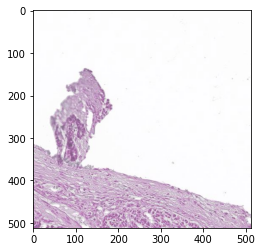

In [43]:
plt.imshow(imO)

In [44]:
import pandas as pd
FullTilesList = os.listdir('/data/gcs/lungNENomics/work/MathianE/TestTiling1426/TNE1426')
df_tiles_list = pd.DataFrame()
xOri = []
yOri = []
Fpath =  []
TilesName = []
for ele in FullTilesList:
    print(ele)
    xo  = int(ele.split('_')[1])
    yo = int(ele.split('_')[2].split('.')[0])
    xOri.append(xo)
    yOri.append(yo)
    TilesName.append(ele)
    Fpath.append(os.path.join('/data/gcs/lungNENomics/work/MathianE/TestTiling1426/TNE1426',ele))


TNE1426_1849_50821.jpg
TNE1426_11089_37885.jpg
TNE1426_23101_55441.jpg
TNE1426_7393_36037.jpg
TNE1426_93325_925.jpg
TNE1426_90553_57289.jpg
TNE1426_8317_14785.jpg
TNE1426_38809_16633.jpg
TNE1426_61909_1.jpg
TNE1426_58213_70225.jpg
TNE1426_81313_62833.jpg
TNE1426_49897_48973.jpg
TNE1426_18481_68377.jpg
TNE1426_15709_11089.jpg
TNE1426_60061_49897.jpg
TNE1426_44353_21253.jpg
TNE1426_41581_14785.jpg
TNE1426_36037_12013.jpg
TNE1426_48973_67453.jpg
TNE1426_78541_10165.jpg
TNE1426_33265_44353.jpg
TNE1426_56365_23101.jpg
TNE1426_72073_40657.jpg
TNE1426_37885_4621.jpg
TNE1426_76693_24025.jpg
TNE1426_12937_56365.jpg
TNE1426_39733_57289.jpg
TNE1426_66529_35113.jpg
TNE1426_31417_45277.jpg
TNE1426_20329_24949.jpg
TNE1426_27721_46201.jpg
TNE1426_1849_36961.jpg
TNE1426_7393_5545.jpg
TNE1426_77617_17557.jpg
TNE1426_89629_11089.jpg
TNE1426_4621_68377.jpg
TNE1426_13861_33265.jpg
TNE1426_64681_70225.jpg
TNE1426_20329_49897.jpg
TNE1426_5545_7393.jpg
TNE1426_29569_38809.jpg
TNE1426_4621_60985.jpg
TNE1426_2

TNE1426_2773_56365.jpg
TNE1426_63757_30493.jpg
TNE1426_86857_48973.jpg
TNE1426_39733_20329.jpg
TNE1426_72073_52669.jpg
TNE1426_67453_69301.jpg
TNE1426_13861_48049.jpg
TNE1426_82237_58213.jpg
TNE1426_89629_5545.jpg
TNE1426_36037_35113.jpg
TNE1426_58213_72997.jpg
TNE1426_91477_20329.jpg
TNE1426_82237_28645.jpg
TNE1426_47125_31417.jpg
TNE1426_46201_30493.jpg
TNE1426_9241_13861.jpg
TNE1426_7393_20329.jpg
TNE1426_75769_52669.jpg
TNE1426_55441_36961.jpg
TNE1426_12013_19405.jpg
TNE1426_41581_34189.jpg
TNE1426_64681_38809.jpg
TNE1426_25873_925.jpg
TNE1426_84085_44353.jpg
TNE1426_13861_36961.jpg
TNE1426_7393_31417.jpg
TNE1426_90553_73921.jpg
TNE1426_36961_64681.jpg
TNE1426_90553_68377.jpg
TNE1426_39733_50821.jpg
TNE1426_78541_43429.jpg
TNE1426_12937_24025.jpg
TNE1426_35113_69301.jpg
TNE1426_30493_72073.jpg
TNE1426_53593_7393.jpg
TNE1426_29569_20329.jpg
TNE1426_71149_53593.jpg
TNE1426_43429_9241.jpg
TNE1426_29569_36961.jpg
TNE1426_41581_20329.jpg
TNE1426_61909_66529.jpg
TNE1426_8317_67453.jpg
TN

TNE1426_70225_60061.jpg
TNE1426_24949_18481.jpg
TNE1426_85009_17557.jpg
TNE1426_38809_29569.jpg
TNE1426_93325_66529.jpg
TNE1426_60985_69301.jpg
TNE1426_92401_28645.jpg
TNE1426_34189_35113.jpg
TNE1426_60061_5545.jpg
TNE1426_69301_16633.jpg
TNE1426_69301_925.jpg
TNE1426_3697_47125.jpg
TNE1426_36961_3697.jpg
TNE1426_62833_48973.jpg
TNE1426_22177_6469.jpg
TNE1426_72073_48049.jpg
TNE1426_66529_24949.jpg
TNE1426_46201_37885.jpg
TNE1426_76693_24949.jpg
TNE1426_33265_62833.jpg
TNE1426_45277_17557.jpg
TNE1426_6469_72073.jpg
TNE1426_60061_20329.jpg
TNE1426_69301_37885.jpg
TNE1426_60061_39733.jpg
TNE1426_12937_20329.jpg
TNE1426_19405_1849.jpg
TNE1426_1849_24025.jpg
TNE1426_28645_9241.jpg
TNE1426_79465_58213.jpg
TNE1426_48973_69301.jpg
TNE1426_86857_18481.jpg
TNE1426_30493_53593.jpg
TNE1426_68377_6469.jpg
TNE1426_18481_19405.jpg
TNE1426_19405_62833.jpg
TNE1426_79465_32341.jpg
TNE1426_31417_63757.jpg
TNE1426_85933_17557.jpg
TNE1426_42505_67453.jpg
TNE1426_69301_34189.jpg
TNE1426_53593_71149.jpg
TNE

TNE1426_46201_65605.jpg
TNE1426_43429_36961.jpg
TNE1426_60985_51745.jpg
TNE1426_29569_58213.jpg
TNE1426_74845_925.jpg
TNE1426_18481_22177.jpg
TNE1426_72997_21253.jpg
TNE1426_30493_26797.jpg
TNE1426_17557_62833.jpg
TNE1426_87781_32341.jpg
TNE1426_42505_12937.jpg
TNE1426_25873_39733.jpg
TNE1426_71149_8317.jpg
TNE1426_83161_70225.jpg
TNE1426_11089_45277.jpg
TNE1426_75769_18481.jpg
TNE1426_11089_8317.jpg
TNE1426_13861_925.jpg
TNE1426_25873_31417.jpg
TNE1426_22177_2773.jpg
TNE1426_51745_24949.jpg
TNE1426_94249_39733.jpg
TNE1426_14785_66529.jpg
TNE1426_75769_12937.jpg
TNE1426_60061_11089.jpg
TNE1426_72997_27721.jpg
TNE1426_48049_39733.jpg
TNE1426_20329_12013.jpg
TNE1426_28645_53593.jpg
TNE1426_64681_72073.jpg
TNE1426_38809_60061.jpg
TNE1426_86857_56365.jpg
TNE1426_37885_72073.jpg
TNE1426_68377_69301.jpg
TNE1426_18481_34189.jpg
TNE1426_48049_68377.jpg
TNE1426_59137_60985.jpg
TNE1426_86857_24025.jpg
TNE1426_77617_37885.jpg
TNE1426_84085_57289.jpg
TNE1426_27721_32341.jpg
TNE1426_95173_5545.jpg


In [45]:
df_tiles_list['xOri'] = xOri
df_tiles_list['yOri'] = yOri
df_tiles_list['TilesName'] = TilesName
df_tiles_list['Fpath'] = Fpath

In [46]:
df_tiles_list

,xOri,yOri,TilesName,Fpath
0,1849,50821,TNE1426_1849_50821.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1,11089,37885,TNE1426_11089_37885.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2,23101,55441,TNE1426_23101_55441.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3,7393,36037,TNE1426_7393_36037.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
4,93325,925,TNE1426_93325_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
...,...,...,...,...
8419,72997,72997,TNE1426_72997_72997.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
8420,10165,12937,TNE1426_10165_12937.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
8421,28645,32341,TNE1426_28645_32341.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
8422,1849,59137,TNE1426_1849_59137.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...


In [47]:
x8 =  35020.8
x8p512 = 36864.0
y8   = 53452.8
y8p512  = 55296.0
df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                    &  (df_tiles_list['xOri'] > x8) \
                   & (df_tiles_list['yOri'] < y8p512) \
                   &  (df_tiles_list['yOri'] > y8)  ] 

,xOri,yOri,TilesName,Fpath
2440,36037,54517,TNE1426_36037_54517.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3127,35113,54517,TNE1426_35113_54517.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
5696,36037,53593,TNE1426_36037_53593.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
5823,35113,53593,TNE1426_35113_53593.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...


In [50]:
p = SegPath
x = int(p.split('/')[-1].split('_')[1])
x8 = x * 3.6
print('x ', x, 'x8 ', x8)
y = int(p.split('/')[-1].split('_')[2].split('-')[0])
y8 = y * 3.6
print('y ', y, 'y8 ', y8)
xp512 = x + (512 )
x8p512  = xp512 * 4.6
print('xp512 ', xp512, 'x8p512 ', x8p512)

yp512 = y + (512)
y8p512  = yp512 * 4.6
print('yp512 ', yp512, 'y8p512 ', y8p512)
print(df_tiles_list[(df_tiles_list['yOri'] < y8p512) \
                   &  (df_tiles_list['yOri'] > y8)])

print(df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                    &  (df_tiles_list['xOri'] > x8) ])
sub_df = df_tiles_list[(df_tiles_list['xOri']  < x8p512) \
                    &  (df_tiles_list['xOri'] > x8) \
                   & (df_tiles_list['yOri'] < y8p512) \
                   &  (df_tiles_list['yOri'] > y8)  ] 
sub_df

x  1024 x8  3686.4
y  0 y8  0.0
xp512  1536 x8p512  7065.599999999999
yp512  512 y8p512  2355.2
       xOri  yOri               TilesName  \
4     93325   925   TNE1426_93325_925.jpg   
8     61909     1     TNE1426_61909_1.jpg   
68    45277   925   TNE1426_45277_925.jpg   
112   27721     1     TNE1426_27721_1.jpg   
152   52669  1849  TNE1426_52669_1849.jpg   
...     ...   ...                     ...   
8290  17557   925   TNE1426_17557_925.jpg   
8293  84085  1849  TNE1426_84085_1849.jpg   
8347  75769  1849  TNE1426_75769_1849.jpg   
8406  30493     1     TNE1426_30493_1.jpg   
8416  76693     1     TNE1426_76693_1.jpg   

                                                  Fpath  
4     /data/gcs/lungNENomics/work/MathianE/TestTilin...  
8     /data/gcs/lungNENomics/work/MathianE/TestTilin...  
68    /data/gcs/lungNENomics/work/MathianE/TestTilin...  
112   /data/gcs/lungNENomics/work/MathianE/TestTilin...  
152   /data/gcs/lungNENomics/work/MathianE/TestTilin...  
...            

,xOri,yOri,TilesName,Fpath
1037,3697,1,TNE1426_3697_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1140,4621,925,TNE1426_4621_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1643,5545,925,TNE1426_5545_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1974,6469,925,TNE1426_6469_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2164,3697,1849,TNE1426_3697_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2706,5545,1849,TNE1426_5545_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2786,4621,1849,TNE1426_4621_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3571,5545,1,TNE1426_5545_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3804,6469,1849,TNE1426_6469_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
5838,6469,1,TNE1426_6469_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...


In [56]:
sub_df = sub_df.sort_values(['xOri', 'yOri'])

In [57]:
sub_df.shape

(12, 4)

In [58]:
sub_df

,xOri,yOri,TilesName,Fpath
1037,3697,1,TNE1426_3697_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
7754,3697,925,TNE1426_3697_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2164,3697,1849,TNE1426_3697_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
5980,4621,1,TNE1426_4621_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1140,4621,925,TNE1426_4621_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2786,4621,1849,TNE1426_4621_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3571,5545,1,TNE1426_5545_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1643,5545,925,TNE1426_5545_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2706,5545,1849,TNE1426_5545_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
5838,6469,1,TNE1426_6469_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...


In [63]:
imgre = np.zeros((512 *4, 512 * 3, 3))

In [66]:
for i in range(sub_df.shape[0]):
    print(sub_df.iloc[i,0],  sub_df.iloc[i,1] )
    cim = cv2.imread(sub_df.iloc[i,3])
    print(cim.shape)
    if sub_df.iloc[i,0] == 3697:
        x = 0
    elif  sub_df.iloc[i,0] == 4621:
        x = 512
    elif  sub_df.iloc[i,0] == 5545:
        x = 1024
    else:
        x = 1536
    if  sub_df.iloc[i,1] == 1:
        y = 0
    elif  sub_df.iloc[i,1] == 925:
        y = 512
    else:
        y = 1024
    imgre[x:x+512, y:y+512, :] = cim

3697 1
(512, 512, 3)
3697 925
(512, 512, 3)
3697 1849
(512, 512, 3)
4621 1
(512, 512, 3)
4621 925
(512, 512, 3)
4621 1849
(512, 512, 3)
5545 1
(512, 512, 3)
5545 925
(512, 512, 3)
5545 1849
(512, 512, 3)
6469 1
(512, 512, 3)
6469 925
(512, 512, 3)
6469 1849
(512, 512, 3)


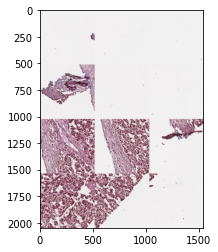

In [67]:
plt.imshow(imgre.astype('uint8'))

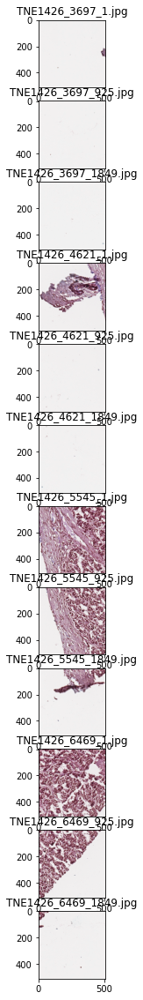

In [68]:
plt.figure(figsize = (19,20))
c = 1
for i in range(sub_df.shape[0]):
    cim = cv2.imread(sub_df.iloc[i,3])
    plt.subplot(sub_df.shape[0], 1, c)
    plt.imshow(cim)
    plt.title(sub_df.iloc[i,2])
    c += 1

In [52]:
sub_df

,xOri,yOri,TilesName,Fpath
1037,3697,1,TNE1426_3697_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1140,4621,925,TNE1426_4621_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1643,5545,925,TNE1426_5545_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
1974,6469,925,TNE1426_6469_925.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2164,3697,1849,TNE1426_3697_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2706,5545,1849,TNE1426_5545_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
2786,4621,1849,TNE1426_4621_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3571,5545,1,TNE1426_5545_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
3804,6469,1849,TNE1426_6469_1849.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...
5838,6469,1,TNE1426_6469_1.jpg,/data/gcs/lungNENomics/work/MathianE/TestTilin...


In [172]:
5120 * 3.6

18432.0

In [173]:
8192 * 3.6

29491.2

In [91]:
for i in range(masknorm.shape[0]):
    for j in range(masknorm.shape[1]):
        print(masknorm[i,j,:])

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[192. 192. 192

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255

[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255

[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[192. 192. 192.]
[  0. 255. 255

[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[255. 255. 255.]
[255. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255.]
[  0. 255. 255

In [75]:
TestSegmentation[0,0,:]

array([255, 255, 249], dtype=uint8)

In [76]:
TestSegmentation[130,130,:]

array([192, 196, 197], dtype=uint8)

In [73]:
TestSegmentation[150,150,:]

array([192, 192, 192], dtype=uint8)

In [9]:
TNE1426_fSeg = cv2.imread('Data/TestImgFullSegTraining2/TNE1426-segmap.jpg')
TNE1426_fSeg = cv2.cvtColor(TNE1426_fSeg, cv2.COLOR_BGR2RGB)

In [36]:
# Cross List of tiles 
list_tiles = '/data/gcs/lungNENomics/work/MathianE/Tiles_512_512_fullHENorm_from1802Dir/TNE1426'
for folder in os.listdir(list_tiles):
    l_tiles = os.listdir(os.path.join(list_tiles, folder))
    for t in l_tiles:
        sample =  t.split('_')[0]
        x = int(t.split('_')[1])
        y = int(t.split('_')[2].split('.')[0])
        xf  = int(x * .25)
        yf = int(y * .25)
        
        xm = x + 925
        ym = y + 925
        
        xmf = int(xm * 0.25)
        ymf = int(ym *0.25)
        
        sub_mask = TNE1426_fSeg[xf:xmf, yf:ymf, :]
        print(sub_mask.shape)
        
        
        TumorMat = np.ones(sub_mask.shape, dtype=np.uint8) 
        TumorMat[:,:,0] = 0
        TumorMat[:,:,1] = 255
        TumorMat[:,:,2] = 255


        NoTumorMat = np.ones(sub_mask.shape, dtype=np.uint8) 
        NoTumorMat[:,:,0] = 192
        NoTumorMat[:,:,1] = 192
        NoTumorMat[:,:,2] = 192


        BackgroundMat = np.ones(sub_mask.shape, dtype=np.uint8) 
        BackgroundMat[:,:,0] = 255
        BackgroundMat[:,:,1] = 255
        BackgroundMat[:,:,2] = 25

        masknorm = np.zeros((sub_mask.shape))
        dT = np.abs(np.sum(sub_mask.astype('int8')  - TumorMat.astype('int8') , axis = 2))
        dNT = np.abs(np.sum(sub_mask.astype('int8')  - NoTumorMat.astype('int8') , axis = 2))
        dB = np.abs(np.sum(sub_mask.astype('int8')  - BackgroundMat.astype('int8') , axis = 2))
        diff_mat = np.zeros((sub_mask.shape))
        diff_mat[:,:,0] = dT
        diff_mat[:,:,1] = dNT
        diff_mat[:,:,2] = dB
        arr2dINDEX = np.argmin(diff_mat, axis = 2)

        masknormOri = np.ones((sub_mask.shape))
        masknormT = np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)) ,
                                 (np.array(arr2dINDEX == 0)*1)),np.transpose(TumorMat,axes=(2,0,1)))
        masknormNT =  np.multiply(np.multiply( np.transpose(masknormOri, axes=(2,0,1)), 
                                 (np.array(arr2dINDEX == 1)*1)), np.transpose(NoTumorMat,axes=(2,0,1)))

        masknormB =  np.multiply(np.multiply(np.transpose(masknormOri, axes=(2,0,1)), 
                                 (np.array(arr2dINDEX == 2)*1)), np.transpose(BackgroundMat, axes=(2,0,1)))
        masknorm = masknormT + masknormNT + masknormB
        masknorm = np.transpose(masknorm, axes=(1,2,0))
        pTumor = np.sum(masknorm[:,:, 0] == 0) / (sub_mask.shape[0] * sub_mask.shape[1] )
        pBackground = np.sum(masknorm[:,:, 0] == 255) / (sub_mask.shape[0] * sub_mask.shape[1] )
        pNoTumor = np.sum(masknorm[:,:, 0] == 192) / (sub_mask.shape[0] * sub_mask.shape[1] )
        
        print('pTumor ', pTumor, 'pBackground ', pBackground, 'pNoTumor ', pNoTumor, pTumor+pBackground+pNoTumor )

(231, 231, 3)
pTumor  0.16961826052735143 pBackground  0.0 pNoTumor  0.8303817394726486 1.0
(231, 231, 3)
pTumor  0.6725323738310751 pBackground  0.04448942111279774 pNoTumor  0.28297820505612714 1.0
(231, 231, 3)
pTumor  0.4748411761398774 pBackground  0.0754108806056858 pNoTumor  0.4497479432544368 1.0
(231, 231, 3)
pTumor  0.5514514345683177 pBackground  0.05562114653023744 pNoTumor  0.3929274189014449 1.0
(231, 231, 3)
pTumor  0.5767695507955248 pBackground  0.05498397706189914 pNoTumor  0.36824647214257605 1.0
(231, 231, 3)
pTumor  0.5202113903412605 pBackground  0.061992841213620434 pNoTumor  0.4177957684451191 1.0
(231, 231, 3)
pTumor  0.48235602781057324 pBackground  0.06343584265662187 pNoTumor  0.45420812953280487 1.0
(231, 231, 3)
pTumor  0.45758137965930173 pBackground  0.06034369670733307 pNoTumor  0.4820749236333652 1.0
(231, 231, 3)
pTumor  0.8877269916230955 pBackground  0.01990217574633159 pNoTumor  0.09237083263057289 1.0
(231, 231, 3)
pTumor  0.5128277206199284 pBack

pTumor  0.49474335188620905 pBackground  0.07050092764378478 pNoTumor  0.43475572047000616 1.0
(231, 231, 3)
pTumor  0.7251175952474653 pBackground  0.053034988099923165 pNoTumor  0.22184741665261146 0.9999999999999999
(231, 231, 3)
pTumor  0.5521823054290587 pBackground  0.06680909278311875 pNoTumor  0.3810086017878226 1.0
(231, 231, 3)
pTumor  0.5762448229980698 pBackground  0.06701523584640467 pNoTumor  0.3567399411555256 1.0
(231, 231, 3)
pTumor  0.0964936938962913 pBackground  0.007814696126384439 pNoTumor  0.8956916099773242 1.0
(231, 231, 3)
pTumor  0.41669009201476737 pBackground  0.054477989542924606 pNoTumor  0.528831918442308 1.0
(231, 231, 3)
pTumor  0.47352935664623974 pBackground  0.05770131744157718 pNoTumor  0.46876932591218307 1.0
(231, 231, 3)
pTumor  0.5743333145930548 pBackground  0.061224489795918366 pNoTumor  0.36444219561102675 0.9999999999999999
(231, 231, 3)
pTumor  0.6973070219823466 pBackground  0.0476565281760087 pNoTumor  0.25503644984164464 1.0
(231, 231, 

pTumor  0.7544461310695076 pBackground  0.04758156706208654 pNoTumor  0.19797230186840575 0.9999999999999999
(231, 231, 3)
pTumor  0.2819849702966586 pBackground  0.047244242049436856 pNoTumor  0.6707707876539045 1.0
(231, 231, 3)
pTumor  0.5774629410993047 pBackground  0.06384812878319372 pNoTumor  0.3586889301175015 1.0
(231, 231, 3)
pTumor  0.47619047619047616 pBackground  0.055283821517587754 pNoTumor  0.4685257022919361 1.0
(231, 231, 3)
pTumor  0.14950994171773394 pBackground  0.0 pNoTumor  0.8504900582822661 1.0
(231, 231, 3)
pTumor  0.3410355877888345 pBackground  0.05801990217574633 pNoTumor  0.6009445100354192 1.0
(231, 231, 3)
pTumor  0.6619815970465321 pBackground  0.051310882479713646 pNoTumor  0.28670752047375425 1.0
(231, 231, 3)
pTumor  0.5650568767451885 pBackground  0.05001780326455651 pNoTumor  0.38492531999025503 1.0
(231, 231, 3)
pTumor  0.4059331721669384 pBackground  0.06740878169449598 pNoTumor  0.5266580461385656 1.0
(231, 231, 3)
pTumor  0.6815089672232529 pBa

pTumor  0.36241824553512864 pBackground  0.07319952774498228 pNoTumor  0.564382226719889 1.0
(231, 231, 3)
pTumor  0.5696669852514008 pBackground  0.057663836884616106 pNoTumor  0.37266917786398307 1.0
(231, 231, 3)
pTumor  0.024531024531024532 pBackground  0.004834991847978861 pNoTumor  0.9706339836209966 1.0
(231, 231, 3)
pTumor  0.5588725848466108 pBackground  0.0627611926313225 pNoTumor  0.3783662225220667 1.0
(231, 231, 3)
pTumor  0.6260002623638987 pBackground  0.06843949701092558 pNoTumor  0.30556024062517567 1.0
(231, 231, 3)
pTumor  0.4629036187477746 pBackground  0.06131819118832106 pNoTumor  0.47577819006390437 1.0
(231, 231, 3)
pTumor  0.3220516856880493 pBackground  0.042859016884990914 pNoTumor  0.6350892974269597 1.0
(231, 231, 3)
pTumor  0.41766458649575533 pBackground  0.0604561383782163 pNoTumor  0.5218792751260284 1.0
(231, 231, 3)
pTumor  0.49687974363299037 pBackground  0.05524634096062667 pNoTumor  0.44787391540638294 1.0
(231, 231, 3)
pTumor  0.630329266692903 pB

pTumor  0.2712842712842713 pBackground  0.06152433425160698 pNoTumor  0.6671913944641218 1.0
(231, 231, 3)
pTumor  0.26929780176533424 pBackground  0.0 pNoTumor  0.7307021982346658 1.0
(231, 231, 3)
pTumor  0.15873015873015872 pBackground  0.0 pNoTumor  0.8412698412698413 1.0
(231, 231, 3)
pTumor  0.5814171398586983 pBackground  0.05901313693521486 pNoTumor  0.3595697232060868 0.9999999999999999
(231, 231, 3)
pTumor  0.5093795093795094 pBackground  0.062423867618672815 pNoTumor  0.4281966230018178 1.0
(231, 231, 3)
pTumor  0.7235059312981391 pBackground  0.05084237551770019 pNoTumor  0.22565169318416073 1.0
(231, 231, 3)
pTumor  0.46983752178557375 pBackground  0.05254774085942917 pNoTumor  0.4776147373549971 1.0
(231, 231, 3)
pTumor  0.2818163077903338 pBackground  0.03097768032832968 pNoTumor  0.6872060118813366 1.0
(231, 231, 3)
pTumor  0.16585146455276326 pBackground  0.0 pNoTumor  0.8341485354472368 1.0
(231, 231, 3)
pTumor  0.12308614906017504 pBackground  0.0 pNoTumor  0.8769138

pTumor  0.44140851933059727 pBackground  0.05151702554299957 pNoTumor  0.5070744551264031 1.0
(231, 231, 3)
pTumor  0.8605348475478346 pBackground  0.029253574708120164 pNoTumor  0.11021157774404527 1.0
(231, 231, 3)
pTumor  0.20080208391896703 pBackground  0.0 pNoTumor  0.799197916081033 1.0
(231, 231, 3)
pTumor  0.43224452315361406 pBackground  0.06401679128951857 pNoTumor  0.5037386855568674 1.0
(231, 231, 3)
pTumor  0.107138172073237 pBackground  0.0 pNoTumor  0.8928618279267629 1.0
(231, 231, 3)
pTumor  0.7250988549689849 pBackground  0.05466539232772999 pNoTumor  0.22023575270328516 1.0
(231, 231, 3)
pTumor  0.15539438916062293 pBackground  0.002979704278405577 pNoTumor  0.8416259065609715 1.0
(231, 231, 3)
pTumor  0.33391428196623 pBackground  0.04833117820130807 pNoTumor  0.6177545398324619 1.0
(231, 231, 3)
pTumor  0.30569142257453946 pBackground  0.009107775341541575 pNoTumor  0.685200802083919 1.0
(231, 231, 3)
pTumor  0.6102396881617661 pBackground  0.05003654354303705 pNoT

pTumor  0.79282622139765 pBackground  0.04345870579636813 pNoTumor  0.1637150728059819 1.0
(231, 231, 3)
pTumor  0.2220160791589363 pBackground  0.05434680759356084 pNoTumor  0.7236371132475029 1.0
(231, 231, 3)
pTumor  0.5706414797323889 pBackground  0.06553475384644215 pNoTumor  0.36382376642116904 1.0
(231, 231, 3)
pTumor  0.5970277918329866 pBackground  0.06246134817563389 pNoTumor  0.3405108599913795 1.0
(231, 231, 3)
pTumor  0.49642997694945745 pBackground  0.06510372744138979 pNoTumor  0.43846629560915273 1.0
(231, 231, 3)
pTumor  0.09623132999756376 pBackground  0.0 pNoTumor  0.9037686700024362 1.0
(231, 231, 3)
pTumor  0.5909372013268117 pBackground  0.06116826896047675 pNoTumor  0.3478945297127115 1.0
(231, 231, 3)
pTumor  0.3373062723712074 pBackground  0.05835722718839602 pNoTumor  0.6043365004403966 1.0
(231, 231, 3)
pTumor  0.4857105376585896 pBackground  0.06249882873259496 pNoTumor  0.45179063360881544 1.0
(231, 231, 3)
pTumor  0.8687243492438298 pBackground  0.02672363

pTumor  0.4625288131781638 pBackground  0.060812203669346525 pNoTumor  0.47665898315248967 1.0
(231, 231, 3)
pTumor  0.4260227506980754 pBackground  0.058806993871928934 pNoTumor  0.5151702554299957 1.0
(231, 231, 3)
pTumor  0.650906092464534 pBackground  0.0627611926313225 pNoTumor  0.28633271490414347 1.0
(231, 231, 3)
pTumor  0.5950038417570885 pBackground  0.05339105339105339 pNoTumor  0.3516051048518581 1.0
(231, 231, 3)
pTumor  0.879143944079009 pBackground  0.024737167594310452 pNoTumor  0.09611888832668053 1.0
(231, 231, 3)
pTumor  0.43606753996364384 pBackground  0.07226251382095537 pNoTumor  0.4916699462154008 1.0
(231, 231, 3)
pTumor  0.0025299375948726597 pBackground  0.0 pNoTumor  0.9974700624051274 1.0
(231, 231, 3)
pTumor  0.3895166882179869 pBackground  0.06270497179588089 pNoTumor  0.5477783399861322 1.0
(231, 231, 3)
pTumor  0.5156575026704897 pBackground  0.0742864638968535 pNoTumor  0.4100560334326568 1.0
(231, 231, 3)
pTumor  0.5845280260864677 pBackground  0.06650

pTumor  0.5040197897340755 pBackground  0.07261857911208561 pNoTumor  0.42336163115383896 1.0
(231, 231, 3)
pTumor  0.6679035250463822 pBackground  0.045351473922902494 pNoTumor  0.2867450010307153 1.0
(231, 231, 3)
pTumor  0.38629336031933437 pBackground  0.057663836884616106 pNoTumor  0.5560428027960496 1.0
(231, 231, 3)
pTumor  0.057645096606135565 pBackground  0.0 pNoTumor  0.9423549033938644 1.0
(231, 231, 3)
pTumor  0.5444050898596353 pBackground  0.04913701017597121 pNoTumor  0.40645789996439347 1.0
(231, 231, 3)
pTumor  0.29920728622027326 pBackground  0.009595022582035569 pNoTumor  0.6911976911976911 1.0
(231, 231, 3)
pTumor  0.6013193156050299 pBackground  0.06107456756807406 pNoTumor  0.33760611682689606 1.0
(231, 231, 3)
pTumor  0.3196904105995015 pBackground  0.05906935777065647 pNoTumor  0.621240231629842 1.0
(231, 231, 3)
pTumor  0.5454170648975843 pBackground  0.06008133280860554 pNoTumor  0.3945016022938101 1.0
(231, 231, 3)
pTumor  0.7326137066396806 pBackground  0.04

pTumor  0.6613819081351549 pBackground  0.051460804707557956 pNoTumor  0.28715728715728717 1.0
(231, 231, 3)
pTumor  0.7081201626656172 pBackground  0.041416015441989466 pNoTumor  0.2504638218923933 1.0
(231, 231, 3)
pTumor  0.14696126384438074 pBackground  0.0019677292404565133 pNoTumor  0.8510710069151628 1.0
(231, 231, 3)
pTumor  0.5754389910234066 pBackground  0.06532861078315624 pNoTumor  0.35923239819343716 1.0
(231, 231, 3)
pTumor  0.273851689436105 pBackground  0.03601881523959446 pNoTumor  0.6901294953243006 1.0
(231, 231, 3)
pTumor  0.7454133168418883 pBackground  0.05247277974550702 pNoTumor  0.2021139034126047 1.0
(231, 231, 3)
pTumor  0.5341166769738198 pBackground  0.06926406926406926 pNoTumor  0.3966192537621109 1.0
(231, 231, 3)
pTumor  0.8363411480294597 pBackground  0.03367628042952718 pNoTumor  0.1299825715410131 1.0
(231, 231, 3)
pTumor  0.8726035868893012 pBackground  0.02906617192331478 pNoTumor  0.09833024118738404 1.0
(231, 231, 3)
pTumor  0.02040816326530612 pB

pTumor  0.017428458986900545 pBackground  0.0 pNoTumor  0.9825715410130994 1.0
(231, 231, 3)
pTumor  0.6734319071981409 pBackground  0.056745563239069735 pNoTumor  0.2698225295627893 1.0
(231, 231, 3)
pTumor  0.5904499540863177 pBackground  0.0587882535934484 pNoTumor  0.35076179232023386 1.0
(231, 231, 3)
pTumor  0.6493693896291299 pBackground  0.06422293435280449 pNoTumor  0.2864076760180656 1.0
(231, 231, 3)
pTumor  0.15848653510991173 pBackground  0.0 pNoTumor  0.8415134648900883 1.0
(231, 231, 3)
pTumor  0.15198365847716497 pBackground  0.0 pNoTumor  0.848016341522835 1.0
(231, 231, 3)
pTumor  0.4172523003691835 pBackground  0.06607822192237776 pNoTumor  0.5166694777084387 1.0
(231, 231, 3)
pTumor  0.44995408631772266 pBackground  0.04889338655572422 pNoTumor  0.5011525271265531 1.0
(231, 231, 3)
pTumor  0.0016866250632484399 pBackground  0.0 pNoTumor  0.9983133749367515 1.0
(231, 231, 3)
pTumor  0.12209291430070651 pBackground  0.003991679316354641 pNoTumor  0.8739154063829389 1.

pTumor  0.17036787166657297 pBackground  0.012406064354116302 pNoTumor  0.8172260639793107 1.0
(231, 231, 3)
pTumor  0.8357039785611214 pBackground  0.035793931897828 pNoTumor  0.12850208954105058 1.0
(231, 231, 3)
pTumor  0.059762748074436385 pBackground  0.0024174959239894305 pNoTumor  0.9378197560015742 1.0
(231, 231, 3)
pTumor  0.19516126009632503 pBackground  0.0 pNoTumor  0.8048387399036749 1.0
(231, 231, 3)
pTumor  0.7590000187402784 pBackground  0.04499540863177227 pNoTumor  0.19600457262794926 1.0
(231, 231, 3)
pTumor  0.7886658795749705 pBackground  0.039991754277468566 pNoTumor  0.17134236614756096 1.0
(231, 231, 3)
pTumor  0.5139146567717996 pBackground  0.06053109949213845 pNoTumor  0.42555424373606193 1.0
(231, 231, 3)
pTumor  0.5367777965180562 pBackground  0.0658533385806113 pNoTumor  0.39736886490133244 1.0
(231, 231, 3)
pTumor  0.44416334026723636 pBackground  0.05627705627705628 pNoTumor  0.4995596034557074 1.0
(231, 231, 3)
pTumor  0.24144974794325444 pBackground  0

pTumor  0.3472761005228538 pBackground  0.028072937163846255 pNoTumor  0.6246509623133 1.0
(231, 231, 3)
pTumor  0.4501977099379697 pBackground  0.056726822960589195 pNoTumor  0.4930754671014411 1.0
(231, 231, 3)
pTumor  0.34785704915575044 pBackground  0.05702666741627781 pNoTumor  0.5951162834279717 1.0
(231, 231, 3)
pTumor  0.3951387717621484 pBackground  0.060399917542774684 pNoTumor  0.544461310695077 1.0
(231, 231, 3)
pTumor  0.5673244504413335 pBackground  0.06611570247933884 pNoTumor  0.3665598470793276 1.0
(231, 231, 3)
pTumor  0.1648020089578531 pBackground  0.0 pNoTumor  0.8351979910421469 1.0
(231, 231, 3)
pTumor  0.46794475365903937 pBackground  0.06624688442870261 pNoTumor  0.465808361912258 1.0
(231, 231, 3)
pTumor  0.2979142070051161 pBackground  0.05417814508723599 pNoTumor  0.6479076479076479 1.0
(231, 231, 3)
pTumor  0.3630366747249864 pBackground  0.0737429958209179 pNoTumor  0.5632203294540957 1.0
(231, 231, 3)
pTumor  0.6647738985401324 pBackground  0.057813759112

pTumor  0.585202676111767 pBackground  0.05539626318847098 pNoTumor  0.359401060699762 1.0
(231, 231, 3)
pTumor  0.42442982702722964 pBackground  0.056595641011225425 pNoTumor  0.518974531961545 1.0
(231, 231, 3)
pTumor  0.5416127883660351 pBackground  0.0651599482768314 pNoTumor  0.3932272633571335 1.0
(231, 231, 3)
pTumor  0.5939543861621783 pBackground  0.06255504956803658 pNoTumor  0.343490564269785 1.0
(231, 231, 3)
pTumor  0.4831618597852364 pBackground  0.0641292329604018 pNoTumor  0.4527089072543618 1.0
(231, 231, 3)
pTumor  0.5195929611514027 pBackground  0.07145668184629224 pNoTumor  0.40895035700230503 1.0
(231, 231, 3)
pTumor  0.5458855718595979 pBackground  0.05689548546691404 pNoTumor  0.3972189426734881 1.0
(231, 231, 3)
pTumor  0.5794306703397613 pBackground  0.04846236015067184 pNoTumor  0.3721069695095669 1.0
(231, 231, 3)
pTumor  0.48647888907629167 pBackground  0.06386686906167426 pNoTumor  0.44965424186203407 1.0
(231, 231, 3)
pTumor  0.11187946252881317 pBackgroun

pTumor  0.34564569629504693 pBackground  0.05908809804913701 pNoTumor  0.595266205655816 1.0
(231, 231, 3)
pTumor  0.40703884859729017 pBackground  0.06973257622608273 pNoTumor  0.5232285751766271 1.0
(231, 231, 3)
pTumor  0.5772755383144994 pBackground  0.06343584265662187 pNoTumor  0.35928861902887876 1.0
(231, 231, 3)
pTumor  0.694533460767227 pBackground  0.05387830063154739 pNoTumor  0.2515882386012256 1.0
(231, 231, 3)
pTumor  0.53865182436611 pBackground  0.06948895260583572 pNoTumor  0.3918592230280542 1.0
(231, 231, 3)
pTumor  0.5719532992260264 pBackground  0.06686531361856037 pNoTumor  0.36118138715541315 1.0
(231, 231, 3)
pTumor  0.41149903487565825 pBackground  0.0719814096437473 pNoTumor  0.5165195554805945 1.0
(231, 231, 3)
pTumor  0.6913476134255355 pBackground  0.05507767845430183 pNoTumor  0.25357470812016264 1.0
(231, 231, 3)
pTumor  0.4019414928505838 pBackground  0.06915162759318604 pNoTumor  0.5289068795562302 1.0
(231, 231, 3)
pTumor  0.031671070632109596 pBackgr

pTumor  0.5337980922396507 pBackground  0.06525364966923408 pNoTumor  0.40094825809111523 1.0
(231, 231, 3)
pTumor  0.6284739791233298 pBackground  0.06216150371994528 pNoTumor  0.30936451715672497 1.0
(231, 231, 3)
pTumor  0.45269016697588127 pBackground  0.05466539232772999 pNoTumor  0.49264444069638874 1.0
(231, 231, 3)
pTumor  0.410130994546579 pBackground  0.08032083356758682 pNoTumor  0.5095481718858342 1.0
(231, 231, 3)
pTumor  0.228237851614475 pBackground  0.03772418058132344 pNoTumor  0.7340379678042016 1.0
(231, 231, 3)
pTumor  0.23504057270291037 pBackground  0.0 pNoTumor  0.7649594272970897 1.0
(231, 231, 3)
pTumor  0.39920541219242517 pBackground  0.04465808361912258 pNoTumor  0.5561365041884523 1.0
(231, 231, 3)
pTumor  0.4259852701411143 pBackground  0.052491520023987555 pNoTumor  0.5215232098348982 1.0
(231, 231, 3)
pTumor  0.5709788047450385 pBackground  0.06746500252993759 pNoTumor  0.3615561927250239 1.0
(231, 231, 3)
pTumor  0.7149791045894942 pBackground  0.058638

pTumor  0.5460542343659227 pBackground  0.06167425647945129 pNoTumor  0.39227150915462605 1.0
(231, 231, 3)
pTumor  0.523153614062705 pBackground  0.06131819118832106 pNoTumor  0.41552819474897396 1.0
(231, 231, 3)
pTumor  0.637431832237027 pBackground  0.06645302749198853 pNoTumor  0.2961151402709844 1.0
(231, 231, 3)
pTumor  0.8505087985607466 pBackground  0.029047431644834244 pNoTumor  0.12044376979441915 1.0
(231, 231, 3)
pTumor  0.4360487996851633 pBackground  0.06744626225145706 pNoTumor  0.49650493806337964 1.0
(231, 231, 3)
pTumor  0.3761548696613632 pBackground  0.0714941624032533 pNoTumor  0.5523509679353835 1.0
(231, 231, 3)
pTumor  0.4614793575832537 pBackground  0.057139109087161036 pNoTumor  0.4813815333295853 1.0
(231, 231, 3)
pTumor  0.606753996364386 pBackground  0.06457899964393471 pNoTumor  0.3286670039916793 1.0
(231, 231, 3)
pTumor  0.4750285789246828 pBackground  0.05860085080864302 pNoTumor  0.46637057026667417 1.0
(231, 231, 3)
pTumor  0.5847903899851952 pBackgr

pTumor  0.250801146905043 pBackground  0.058450928580798714 pNoTumor  0.6907479245141582 1.0
(231, 231, 3)
pTumor  0.5034950619366204 pBackground  0.0644290774160904 pNoTumor  0.4320758606472892 1.0
(231, 231, 3)
pTumor  0.5985644946683908 pBackground  0.056708082682108654 pNoTumor  0.34472742264950057 1.0
(231, 231, 3)
pTumor  0.43998425816607634 pBackground  0.06860815951725042 pNoTumor  0.49140758231667325 1.0
(231, 231, 3)
pTumor  0.5630516669477709 pBackground  0.06950769288431626 pNoTumor  0.3674406401679129 1.0
(231, 231, 3)
pTumor  0.5231348737842244 pBackground  0.04098498903693709 pNoTumor  0.4358801371788385 1.0
(231, 231, 3)
pTumor  0.6194599051741909 pBackground  0.06396057045407695 pNoTumor  0.31657952437173215 1.0
(231, 231, 3)
pTumor  0.48494218624088753 pBackground  0.07552332227656904 pNoTumor  0.4395344914825434 1.0
(231, 231, 3)
pTumor  0.3164858229793295 pBackground  0.06382938850471317 pNoTumor  0.6196847885159573 1.0
(231, 231, 3)
pTumor  0.4565506643428721 pBack

pTumor  0.784711680815577 pBackground  0.04289649744195199 pNoTumor  0.17239182174247109 1.0
(231, 231, 3)
pTumor  0.016828770075523324 pBackground  0.0 pNoTumor  0.9831712299244767 1.0
(231, 231, 3)
pTumor  0.473398174696876 pBackground  0.07220629298551376 pNoTumor  0.45439553231761026 1.0
(231, 231, 3)
pTumor  0.47347313581079814 pBackground  0.058057382732707406 pNoTumor  0.4684694814564944 1.0
(231, 231, 3)
pTumor  0.4653585952287251 pBackground  0.06307977736549165 pNoTumor  0.4715616274057832 1.0
(231, 231, 3)
pTumor  0.39199040497741794 pBackground  0.06036243698581361 pNoTumor  0.5476471580367684 1.0
(231, 231, 3)
pTumor  0.11881336556661232 pBackground  0.0 pNoTumor  0.8811866344333876 1.0
(231, 231, 3)
pTumor  0.3540788216112891 pBackground  0.05363467701130039 pNoTumor  0.5922865013774105 1.0
(231, 231, 3)
pTumor  0.5762823035550309 pBackground  0.060699761998463296 pNoTumor  0.3630179344465059 1.0
(231, 231, 3)
pTumor  0.9227150915462604 pBackground  0.02295684113865932 pN

pTumor  0.6022563295290568 pBackground  0.05479657427709376 pNoTumor  0.34294709619384944 1.0
(231, 231, 3)
pTumor  0.5454920260115065 pBackground  0.07106313599820094 pNoTumor  0.38344483799029255 1.0
(231, 231, 3)
pTumor  0.5600532223908847 pBackground  0.05054253106201158 pNoTumor  0.3894042465471037 1.0
(231, 231, 3)
pTumor  0.48072562358276644 pBackground  0.05507767845430183 pNoTumor  0.4641966979629317 1.0
(231, 231, 3)
pTumor  0.6887239744382602 pBackground  0.04960551713798467 pNoTumor  0.26167050842375517 1.0
(231, 231, 3)
pTumor  0.4708120162665617 pBackground  0.05635201739097843 pNoTumor  0.47283596634245983 1.0
(231, 231, 3)
pTumor  0.2869136635370402 pBackground  0.04505162946721388 pNoTumor  0.668034706995746 1.0
(231, 231, 3)
pTumor  0.6726448155019583 pBackground  0.057907460504863104 pNoTumor  0.2694477239931785 0.9999999999999999
(231, 231, 3)
pTumor  0.5272015142145012 pBackground  0.06553475384644215 pNoTumor  0.40726373193905663 1.0
(231, 231, 3)
pTumor  0.068233

pTumor  0.5497835497835498 pBackground  0.05404696313787223 pNoTumor  0.39616948707857796 1.0
(231, 231, 3)
pTumor  0.604317760161916 pBackground  0.05537752290999044 pNoTumor  0.34030471692809355 1.0
(231, 231, 3)
pTumor  0.6481325312494144 pBackground  0.06283615374524465 pNoTumor  0.28903131500534096 1.0
(231, 231, 3)
pTumor  0.3737748542943348 pBackground  0.028616405239781862 pNoTumor  0.5976087404658833 1.0
(231, 231, 3)
pTumor  0.31030153108075187 pBackground  0.0591817994415397 pNoTumor  0.6305166694777085 1.0
(231, 231, 3)
pTumor  0.4845486403927962 pBackground  0.05993141058076123 pNoTumor  0.45551994902644255 1.0
(231, 231, 3)
pTumor  0.33948014467494986 pBackground  0.06508498716290924 pNoTumor  0.5954348681621409 1.0
(231, 231, 3)
pTumor  0.3757051029778303 pBackground  0.07404284027660651 pNoTumor  0.5502520567455632 1.0
(231, 231, 3)
pTumor  0.44598114727984856 pBackground  0.06392308989711587 pNoTumor  0.4900957628230356 1.0
(231, 231, 3)
pTumor  0.7143981559565975 pBac

pTumor  0.07434268473229512 pBackground  0.004310264050523791 pNoTumor  0.9213470512171811 1.0
(231, 231, 3)
pTumor  0.5088922621390154 pBackground  0.05487153539101591 pNoTumor  0.4362362024699687 1.0
(231, 231, 3)
pTumor  0.6416483948951481 pBackground  0.05230411723918217 pNoTumor  0.3060474878656697 1.0
(231, 231, 3)
pTumor  0.8609471336744065 pBackground  0.03260808455613651 pNoTumor  0.1064447817694571 1.0
(231, 231, 3)
pTumor  0.886771237420588 pBackground  0.027042221847416652 pNoTumor  0.08618654073199528 1.0
(231, 231, 3)
pTumor  0.3443151365229287 pBackground  0.05931298139090347 pNoTumor  0.5963718820861678 1.0
(231, 231, 3)
pTumor  0.4692940537096381 pBackground  0.06328592042877758 pNoTumor  0.4674200258615843 1.0
(231, 231, 3)
pTumor  0.062273945390828506 pBackground  0.0 pNoTumor  0.9377260546091715 1.0
(231, 231, 3)
pTumor  0.5209422612020015 pBackground  0.06679035250463822 pNoTumor  0.4122673862933603 1.0
(231, 231, 3)
pTumor  0.4778771012537246 pBackground  0.063773

pTumor  0.6908041453495999 pBackground  0.04508911002417496 pNoTumor  0.26410674462622513 1.0
(231, 231, 3)
pTumor  0.4718802121399524 pBackground  0.04229680853057476 pNoTumor  0.4858229793294728 1.0
(231, 231, 3)
pTumor  0.6795787185397575 pBackground  0.0639418301755964 pNoTumor  0.2564794512846461 1.0
(231, 231, 3)
pTumor  0.4735106163677592 pBackground  0.040216637619235024 pNoTumor  0.48627274601300574 1.0
(231, 231, 3)
pTumor  0.19173178913438654 pBackground  0.0005247277974550702 pNoTumor  0.8077434830681584 1.0
(231, 231, 3)
pTumor  0.4517718933303349 pBackground  0.06439159685912933 pNoTumor  0.4838365098105358 1.0
(231, 231, 3)
pTumor  0.506999494012481 pBackground  0.04977417964430952 pNoTumor  0.44322632634320946 1.0
(231, 231, 3)
pTumor  0.6222709469462716 pBackground  0.05582728959352336 pNoTumor  0.321901763460205 1.0
(231, 231, 3)
pTumor  0.6611008039579468 pBackground  0.0587882535934484 pNoTumor  0.2801109424486048 1.0
(231, 231, 3)
pTumor  0.6652049249451847 pBackgr

pTumor  0.5155263207211259 pBackground  0.06737130113753491 pNoTumor  0.41710237814133916 1.0
(231, 231, 3)
pTumor  0.5300125559865819 pBackground  0.0711943179475647 pNoTumor  0.3987931260658533 1.0
(231, 231, 3)
pTumor  0.40248496092651936 pBackground  0.0639418301755964 pNoTumor  0.5335732088978842 1.0
(231, 231, 3)
pTumor  0.10361499971889582 pBackground  0.0 pNoTumor  0.8963850002811041 1.0
(231, 231, 3)
pTumor  0.5253087460879668 pBackground  0.06223646483386743 pNoTumor  0.4124547890781657 1.0
(231, 231, 3)
pTumor  0.08152021139034125 pBackground  0.0 pNoTumor  0.9184797886096587 1.0
(231, 231, 3)
pTumor  0.4088753958883829 pBackground  0.042090665467288846 pNoTumor  0.5490339386443283 1.0
(231, 231, 3)
pTumor  0.5384269410243436 pBackground  0.0490807893405296 pNoTumor  0.41249226963512675 1.0
(231, 231, 3)
pTumor  0.38395082550926707 pBackground  0.07048218736530425 pNoTumor  0.5455669871254287 1.0
(231, 231, 3)
pTumor  0.5443488690241937 pBackground  0.06128071063135998 pNoTu

pTumor  0.9157249676730196 pBackground  0.013455519949026443 pNoTumor  0.07081951237795393 1.0
(231, 231, 3)
pTumor  0.3186409550045914 pBackground  0.06321095931485542 pNoTumor  0.6181480856805532 1.0
(231, 231, 3)
pTumor  0.49333783100016865 pBackground  0.0627611926313225 pNoTumor  0.44390097636850884 1.0
(231, 231, 3)
pTumor  0.8253968253968254 pBackground  0.03971065010026049 pNoTumor  0.1348925245029141 1.0
(231, 231, 3)
pTumor  0.33912407938381967 pBackground  0.05653942017578381 pNoTumor  0.6043365004403966 1.0
(231, 231, 3)
pTumor  0.5239032252019264 pBackground  0.05603343265680928 pNoTumor  0.42006334214126423 1.0
(231, 231, 3)
pTumor  0.35510953692771874 pBackground  0.058188564682071175 pNoTumor  0.58670189839021 1.0
(231, 231, 3)
pTumor  0.19278124472929667 pBackground  0.0 pNoTumor  0.8072187552707033 1.0
(231, 231, 3)
pTumor  0.5285133337081389 pBackground  0.065947039973014 pNoTumor  0.4055396263188471 1.0
(231, 231, 3)
pTumor  0.5660126309476958 pBackground  0.0568392

pTumor  0.705534004235303 pBackground  0.04475178501152527 pNoTumor  0.2497142107531718 1.0
(231, 231, 3)
pTumor  0.4317010550776785 pBackground  0.06737130113753491 pNoTumor  0.5009276437847866 1.0
(231, 231, 3)
pTumor  0.6299732014017728 pBackground  0.05149828526451903 pNoTumor  0.31852851333370813 1.0
(231, 231, 3)
pTumor  0.22413373062723713 pBackground  0.0 pNoTumor  0.7758662693727629 1.0
(231, 231, 3)
pTumor  0.6039054740353441 pBackground  0.05337231311257285 pNoTumor  0.342722212852083 1.0
(231, 231, 3)
pTumor  0.593036112516632 pBackground  0.05363467701130039 pNoTumor  0.3533292104720676 1.0
(231, 231, 3)
pTumor  0.7931635464102996 pBackground  0.039148441745844344 pNoTumor  0.167688011843856 1.0
(231, 231, 3)
pTumor  0.13644796761679878 pBackground  0.012780869923727067 pNoTumor  0.8507711624594742 1.0
(231, 231, 3)
pTumor  0.5960720376304792 pBackground  0.06709019696032684 pNoTumor  0.33683776540919397 1.0
(231, 231, 3)
pTumor  0.436386124697813 pBackground  0.0357751916

pTumor  0.560203144618729 pBackground  0.06283615374524465 pNoTumor  0.3769607016360263 1.0
(231, 231, 3)
pTumor  0.5157512040628923 pBackground  0.05657690073274489 pNoTumor  0.4276718952043627 1.0
(231, 231, 3)
pTumor  0.06377316766927156 pBackground  0.0 pNoTumor  0.9362268323307285 1.0
(231, 231, 3)
pTumor  0.18714042090665467 pBackground  0.022413373062723712 pNoTumor  0.7904462060306217 1.0
(231, 231, 3)
pTumor  0.4835928861902888 pBackground  0.06150559397312644 pNoTumor  0.4549015198365848 1.0
(231, 231, 3)
pTumor  0.7318266149434981 pBackground  0.044189576657109125 pNoTumor  0.2239838083993928 1.0
(231, 231, 3)
pTumor  0.7117745169693221 pBackground  0.04926819212533498 pNoTumor  0.23895729090534285 1.0
(231, 231, 3)
pTumor  0.6054421768707483 pBackground  0.06529113022619516 pNoTumor  0.32926669290305655 1.0
(231, 231, 3)
pTumor  0.5193868180881168 pBackground  0.06656546916287176 pNoTumor  0.4140477127490115 1.0
(231, 231, 3)
pTumor  0.5344165214295085 pBackground  0.064560

pTumor  0.6947396038305129 pBackground  0.0471692809355147 pNoTumor  0.2580911152339724 1.0
(231, 231, 3)
pTumor  0.5694608421881149 pBackground  0.05254774085942917 pNoTumor  0.3779914169524559 1.0
(231, 231, 3)
pTumor  0.7996476827645659 pBackground  0.040628923745806865 pNoTumor  0.15972339348962725 1.0
(231, 231, 3)
pTumor  0.5401135660875921 pBackground  0.049455594910140364 pNoTumor  0.41043083900226757 1.0
(231, 231, 3)
pTumor  0.3645358970034295 pBackground  0.051573246378441184 pNoTumor  0.5838908566181293 1.0
(231, 231, 3)
pTumor  0.9047244242049437 pBackground  0.018290511797005304 pNoTumor  0.07698506399805101 1.0
(231, 231, 3)
pTumor  0.6084781019845955 pBackground  0.05014898521392028 pNoTumor  0.34137291280148424 1.0
(231, 231, 3)
pTumor  0.9006390434961864 pBackground  0.01967729240456513 pNoTumor  0.07968366409924851 1.0
(231, 231, 3)
pTumor  0.38052135454732855 pBackground  0.05072993384681696 pNoTumor  0.5687487116058545 1.0
(231, 231, 3)
pTumor  0.15355784186953017 

pTumor  0.45508892262139017 pBackground  0.0762916736942711 pNoTumor  0.46861940368433874 1.0
(231, 231, 3)
pTumor  0.4412773373812335 pBackground  0.0556024062517569 pNoTumor  0.5031202563670096 1.0
(231, 231, 3)
pTumor  0.3477071269279062 pBackground  0.05796368134030472 pNoTumor  0.5943291917317891 1.0
(231, 231, 3)
pTumor  0.4278592979891681 pBackground  0.07123179850452578 pNoTumor  0.5009089035063061 1.0
(231, 231, 3)
pTumor  0.8815239594460373 pBackground  0.026086467644909204 pNoTumor  0.09238957290905343 1.0
(231, 231, 3)
pTumor  0.5004403965442926 pBackground  0.06287363430220573 pNoTumor  0.4366859691535016 1.0
(231, 231, 3)
pTumor  0.04833117820130807 pBackground  0.002960963999925039 pNoTumor  0.9487078577987669 1.0
(231, 231, 3)
pTumor  0.6367009613762861 pBackground  0.056858004909952964 pNoTumor  0.30644103371376097 1.0
(231, 231, 3)
pTumor  0.5626581210996795 pBackground  0.05603343265680928 pNoTumor  0.3813084462435112 1.0
(231, 231, 3)
pTumor  0.4649275688236727 pBac

pTumor  0.4170086767489365 pBackground  0.07012612207417403 pNoTumor  0.5128652011768895 1.0
(231, 231, 3)
pTumor  0.44421956110267796 pBackground  0.07443638612469781 pNoTumor  0.4813440527726242 1.0
(231, 231, 3)
pTumor  0.4772774123423474 pBackground  0.07125053878300631 pNoTumor  0.45147204887464626 1.0
(231, 231, 3)
pTumor  0.428796311913195 pBackground  0.06414797323888233 pNoTumor  0.5070557148479227 1.0
(231, 231, 3)
pTumor  0.5629204849984071 pBackground  0.04953055602406252 pNoTumor  0.3875489589775304 1.0
(231, 231, 3)
pTumor  0.45570735181124794 pBackground  0.06313599820093327 pNoTumor  0.4811566499878188 1.0
(231, 231, 3)
pTumor  0.4509473210771912 pBackground  0.06619066359326099 pNoTumor  0.4828620153295478 1.0
(231, 231, 3)
pTumor  0.5335919491763648 pBackground  0.07312456663106014 pNoTumor  0.3932834841925751 1.0
(231, 231, 3)
pTumor  0.05024268660632297 pBackground  0.0 pNoTumor  0.9497573133936771 1.0
(231, 231, 3)
pTumor  0.8625775379022133 pBackground  0.03663724

pTumor  0.5384644215813047 pBackground  0.052004272783493566 pNoTumor  0.40953130563520174 1.0
(231, 231, 3)
pTumor  0.8272521129663987 pBackground  0.03699330972058245 pNoTumor  0.13575457731301888 1.0
(231, 231, 3)
pTumor  0.40632671801502973 pBackground  0.0690391859223028 pNoTumor  0.5246340960626675 1.0
(231, 231, 3)
pTumor  0.4612919547984483 pBackground  0.06671539139071607 pNoTumor  0.4719926538108356 1.0
(231, 231, 3)
pTumor  0.32409437604242797 pBackground  0.05940668278330616 pNoTumor  0.6164989411742658 1.0
(231, 231, 3)
pTumor  0.6341897640598939 pBackground  0.04784393096081408 pNoTumor  0.317966304979292 1.0
(231, 231, 3)
pTumor  0.4635595284945934 pBackground  0.06216150371994528 pNoTumor  0.4742789677854613 1.0
(231, 231, 3)
pTumor  0.4045089110024175 pBackground  0.066434287213508 pNoTumor  0.5290568017840745 1.0
(231, 231, 3)
pTumor  0.3764172335600907 pBackground  0.05550870485935421 pNoTumor  0.5680740615805551 1.0
(231, 231, 3)
pTumor  0.6420794213002006 pBackgrou

pTumor  0.49731077003804275 pBackground  0.07312456663106014 pNoTumor  0.4295646633308971 1.0
(231, 231, 3)
pTumor  0.08155769194730234 pBackground  0.0 pNoTumor  0.9184423080526977 1.0
(231, 231, 3)
pTumor  0.13187533966754747 pBackground  0.0 pNoTumor  0.8681246603324525 1.0
(231, 231, 3)
pTumor  0.52542118775885 pBackground  0.05940668278330616 pNoTumor  0.41517212945784376 1.0
(231, 231, 3)
pTumor  0.7966679784861603 pBackground  0.04836865875826915 pNoTumor  0.15496336275557054 1.0
(231, 231, 3)
pTumor  0.47272352467157663 pBackground  0.06317347875789434 pNoTumor  0.46410299657052906 1.0
(231, 231, 3)
pTumor  0.5199677667210135 pBackground  0.05908809804913701 pNoTumor  0.4209441352298495 1.0
(231, 231, 3)
pTumor  0.02992822473341954 pBackground  0.0 pNoTumor  0.9700717752665805 1.0
(231, 231, 3)
pTumor  0.5322613894042465 pBackground  0.05680178407451135 pNoTumor  0.4109368265212421 0.9999999999999999
(231, 231, 3)
pTumor  0.7160473004628849 pBackground  0.051966792226532485 pNo

pTumor  0.6897921703116509 pBackground  0.05577106875808174 pNoTumor  0.2544367609302674 1.0
(231, 231, 3)
pTumor  0.6064541519086973 pBackground  0.06564719551732538 pNoTumor  0.32789865257397727 1.0
(231, 231, 3)
pTumor  0.5980959877063773 pBackground  0.055415003466951517 pNoTumor  0.34648900882667116 1.0
(231, 231, 3)
pTumor  0.807068833042859 pBackground  0.03684338749273814 pNoTumor  0.15608777946440283 1.0
(231, 231, 3)
pTumor  0.5336669102902869 pBackground  0.0640355315679991 pNoTumor  0.402297558141714 1.0
(231, 231, 3)
pTumor  0.7639474522591406 pBackground  0.049455594910140364 pNoTumor  0.18659695283071906 1.0
(231, 231, 3)
pTumor  0.5531193193530856 pBackground  0.05841344802383763 pNoTumor  0.38846723262307675 1.0
(231, 231, 3)
pTumor  0.10042915237720433 pBackground  0.008433125316242199 pNoTumor  0.8911377223065535 1.0
(231, 231, 3)
pTumor  0.35510953692771874 pBackground  0.07411780139052866 pNoTumor  0.5707726616817526 1.0
(231, 231, 3)
pTumor  0.5995764697063398 pBa

pTumor  0.02224471055639887 pBackground  0.0 pNoTumor  0.9777552894436011 1.0
(231, 231, 3)
pTumor  0.6921909259571597 pBackground  0.05339105339105339 pNoTumor  0.25441802065178687 1.0
(231, 231, 3)
pTumor  0.37206948895260583 pBackground  0.05069245328985589 pNoTumor  0.5772380577575382 1.0
(231, 231, 3)
pTumor  0.19960270609621258 pBackground  0.0 pNoTumor  0.8003972939037874 1.0
(231, 231, 3)
pTumor  0.6525927175277825 pBackground  0.05783249939094095 pNoTumor  0.2895747830812766 1.0
(231, 231, 3)
pTumor  0.7905773879799853 pBackground  0.03845505144206443 pNoTumor  0.17096756057795018 0.9999999999999999
(231, 231, 3)
pTumor  0.5057251550758044 pBackground  0.06857067896028934 pNoTumor  0.4257041659639062 1.0
(231, 231, 3)
pTumor  0.400348569179738 pBackground  0.06379190794775211 pNoTumor  0.5358595228725099 1.0
(231, 231, 3)
pTumor  0.6540544592492644 pBackground  0.06435411630216825 pNoTumor  0.28159142444856733 1.0
(231, 231, 3)
pTumor  0.44789265568486347 pBackground  0.049905

pTumor  0.615318303629992 pBackground  0.051554506099960644 pNoTumor  0.3331271902700474 1.0
(231, 231, 3)
pTumor  0.389310545154701 pBackground  0.06851445812484773 pNoTumor  0.5421749967204512 1.0
(231, 231, 3)
pTumor  0.47435392889938344 pBackground  0.061880399542737205 pNoTumor  0.46376567155787934 1.0
(231, 231, 3)
pTumor  0.6750435711474673 pBackground  0.051329622758194186 pNoTumor  0.27362680609433854 1.0
(231, 231, 3)
pTumor  0.0006746500252993759 pBackground  0.0 pNoTumor  0.9993253499747006 1.0
(231, 231, 3)
pTumor  0.6074099061112048 pBackground  0.06360450516294672 pNoTumor  0.3289855887258485 1.0
(231, 231, 3)
pTumor  0.4875096043927213 pBackground  0.0604561383782163 pNoTumor  0.45203425722906243 1.0
(231, 231, 3)
pTumor  0.5983021307696632 pBackground  0.05905061749217593 pNoTumor  0.34264725173816085 1.0
(231, 231, 3)
pTumor  0.5858960664155469 pBackground  0.06128071063135998 pNoTumor  0.3528232229530931 1.0
(231, 231, 3)
pTumor  0.43861621783699706 pBackground  0.06

pTumor  0.057157849365641576 pBackground  9.37013924026911e-05 pNoTumor  0.9427484492419558 1.0
(231, 231, 3)
pTumor  0.6132568729971327 pBackground  0.05595847154288713 pNoTumor  0.33078465545998015 1.0
(231, 231, 3)
pTumor  0.5424561008976594 pBackground  0.06347332321358296 pNoTumor  0.3940705758887577 1.0
(231, 231, 3)
pTumor  0.691609977324263 pBackground  0.05627705627705628 pNoTumor  0.2521129663986807 1.0
(231, 231, 3)
pTumor  0.11692059744007796 pBackground  0.0 pNoTumor  0.883079402559922 1.0
(231, 231, 3)
pTumor  0.5017334757594498 pBackground  0.06746500252993759 pNoTumor  0.43080152171061264 1.0
(231, 231, 3)
pTumor  0.4239238395082551 pBackground  0.05653942017578381 pNoTumor  0.5195367403159611 1.0
(231, 231, 3)
pTumor  0.6005322239088473 pBackground  0.060812203669346525 pNoTumor  0.33865557242180616 1.0
(231, 231, 3)
pTumor  0.20316335900751487 pBackground  0.0 pNoTumor  0.7968366409924852 1.0
(231, 231, 3)
pTumor  0.6754745975525196 pBackground  0.059631566125072616 p

pTumor  0.5166132568729971 pBackground  0.06667791083375499 pNoTumor  0.4167088322932479 1.0
(231, 231, 3)
pTumor  0.37937819756001573 pBackground  0.0632484398718165 pNoTumor  0.5573733625681677 1.0
(231, 231, 3)
pTumor  0.2786492007271228 pBackground  0.0 pNoTumor  0.7213507992728772 1.0
(231, 231, 3)
pTumor  0.4556136504188452 pBackground  0.0364311013661663 pNoTumor  0.5079552482149885 1.0
(231, 231, 3)
pTumor  0.46597702441858285 pBackground  0.06598452052997507 pNoTumor  0.46803845505144204 1.0
(231, 231, 3)
pTumor  0.8829294803320777 pBackground  0.02370645227788085 pNoTumor  0.09336406739004141 1.0
(231, 231, 3)
pTumor  0.6021626281366541 pBackground  0.05327861172017016 pNoTumor  0.3445587601431757 1.0
(231, 231, 3)
pTumor  0.1455744832368209 pBackground  0.0 pNoTumor  0.8544255167631791 1.0
(231, 231, 3)
pTumor  0.701636026311351 pBackground  0.059387942504825625 pNoTumor  0.23897603118382338 1.0
(231, 231, 3)
pTumor  0.38708045201551694 pBackground  0.055021457618860216 pNoT

pTumor  0.9999250388860779 pBackground  0.0 pNoTumor  7.496111392215288e-05 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.4458874458874459 pBackground  0.0 pNoTumor  0.5541125541125541 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.5903749929723956 pBackground  0.006446655797305148 pNoTumor  0.40317835123029927 1.0
(231, 231, 3)
pTumor  0.9959333595697232 pBackground  0.0 pNoTumor  0.004066640430276794 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.5198928056070913 pBackground  0.0 pNoTumor  0.48010719439290866 1.0
(231, 231, 3)
pTumor  0.9939656303292667 pBackground  0.0 pNoTumor  0.006034369670733307 1.0
(231, 231, 3)
pTumor  0.7324263038548753 pBackground  0.03866119450535035 pN

pTumor  0.35908247596559284 pBackground  0.0 pNoTumor  0.6409175240344072 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.36532298869961205 pBackground  0.0 pNoTumor  0.6346770113003879 1.0
(231, 231, 3)
pTumor  0.9991192069114148 pBackground  0.0 pNoTumor  0.0008807930885852964 1.0
(231, 231, 3)
pTumor  0.9993628305316617 pBackground  0.0 pNoTumor  0.0006371694683382995 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9695470474691253 pBackground  0.004047900151796255 pNoTumor  0.026405052379078354 0.9999999999999999
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9759562227094695 pBackground  0.0 pNoTumor  0.024043777290530536 1.0
(231, 231, 3)
pTumor  0.34009857386480763 pBackground  0.0 pNoTumor  0.6599014261351923 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 p

pTumor  0.7300275482093664 pBackground  0.04507036974569442 pNoTumor  0.2249020820449392 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9996626749873503 pBackground  0.0 pNoTumor  0.00033732501264968796 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.47283596634245983 pBackground  0.0 pNoTumor  0.5271640336575402 1.0
(231, 231, 3)
pTumor  0.7761661138284515 pBackground  0.0 pNoTumor  0.2238338861715485 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumo

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9999250388860779 pBackground  0.0 pNoTumor  7.496111392215288e-05 1.0
(231, 231, 3)
pTumor  0.33363317778902196 pBackground  0.0 pNoTumor  0.6663668222109781 1.0
(231, 231, 3)
pTumor  0.6583647232997882 pBackground  0.040347819568598786 pNoTumor  0.301287457131613 1.0
(231, 231, 3)
pTumor  0.8040891287644535 pBackground  0.0 pNoTumor  0.19591087123554657 1.0
(231, 231, 3)
pTumor  0.6171548509210847 pBackground  0.0 pNoTumor  0.3828451490789153 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9922415247090571 pBackground  0.0 pNoTumor  0.007758475290942824 1.0
(231, 231, 3)
pTumor  0.25503644984164464 pBackground  0.0 pNoTumor  0.7449635501583554 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.6497629354772212 pBackground  0.0 pNoTumor  0.3502370645227788 1.0
(231, 231, 3)
pTumor  0.5022582035569049 pBackground  0.0 pNoTumor  0.497741796

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.5428683870242311 pBackground  0.0 pNoTumor  0.4571316129757688 1.0
(231, 231, 3)
pTumor  0.5059312981390903 pBackground  0.0 pNoTumor  0.4940687018609097 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.3457581379659302 pBackground  0.0 pNoTumor  0.6542418620340699 1.0
(231, 231, 3)
pTumor  0.7577631603605629 pBackground  0.045370214201383034 pNoTumor  0.196866625438054 0.9999999999999999
(231, 231, 3)
pTumor  0.9997938569367141 pBackground  0.0 pNoTumor  0.00020614306328592042 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.262363898727

pTumor  0.9960083206836453 pBackground  0.0 pNoTumor  0.003991679316354641 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.6700399167931635 pBackground  0.005078615468225858 pNoTumor  0.3248814677386106 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9999250388860779 pBackground  0.0 pNoTumor  7.496111392215288e-05 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9476021813684151 pBackground  0.0049661737973426285 pNoTumor  0.04743164483424224 1.0
(231, 231, 3)
pTumor  0.9997751166582335 pBackground  0.0 pN

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.8559247390416221 pBackground  0.0 pNoTumor  0.14407526095837783 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.5975337793519612 pBackground  0.0 pNoTumor  0.40246622064803883 1.0
(231, 231, 3)
pTumor  0.6662168999831337 pBackground  0.0 pNoTumor  0.33378310001686623 1.0
(231, 231, 3)
pTumor  0.9910796274432638 pBackground  0.0 pNoTumor  0.008920372556736193 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9998125972151947 pBackground  0.0 pNoTumor  0.0001874027848053822 1.0
(2

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9996814152658309 pBackground  0.0 pNoTumor  0.00031858473416914975 1.0
(231, 231, 3)
pTumor  0.9999625194430389 pBackground  0.0 pNoTumor  3.748055696107644e-05 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.5245591349487453 pBackground  0.015685613088210492 pNoTumor  0.4597552519630442 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.5863458330990798 pBackground  0.0 pNoTumor  0.41365416690092016 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
p

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9924664080508236 pBackground  0.0 pNoTumor  0.007533591949176365 1.0
(231, 231, 3)
pTumor  0.9946402803545661 pBackground  0.0 pNoTumor  0.005359719645433931 1.0
(231, 231, 3)
pTumor  0.8386649425610465 pBackground  0.022375892505762635 pNoTumor  0.1389591649331909 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.28224733419538617 pBackground  0.0 pNoTumor  0.7177526658046138 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.31288768951106616 pBackground  0.0 pNoTumor  0.6871123104889338 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTu

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.6751934933753115 pBackground  0.0 pNoTumor  0.32480650662468846 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.8089990817263545 pBackground  0.0 pNoTumor  0.19100091827364554 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.9997938569367141 pBackground  0.0 pNoTumor  0.00020614306328592042 1.0
(231, 231, 3)
pTumor  0.6218024399842582 pBackground  0.0005059875189745319 pNoTumor  0.3776915724967673 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.8591855474972359 pBackground  0.0 pNoTumor  0.1408144525027642 1.0
(231, 231, 3)
pTumor  0.29969453346076724 pBackground  0.0 pNoTumor  0.7003054665392328 1.0
(231, 231, 3)
pTumor  0.9986694402278817 pBackground  0.0 pNoTumor  0.0013305597721182136 1.0
(231, 231, 3)
pTumor  0.6530424842113154 pBa

pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.6785105226663668 pBackground  0.03485691797380109 pNoTumor  0.28663255935983206 1.0
(231, 231, 3)
pTumor  0.9987631416202845 pBackground  0.0 pNoTumor  0.0012368583797155227 1.0
(231, 231, 3)
pTumor  0.4404715054065703 pBackground  0.0 pNoTumor  0.5595284945934297 1.0
(231, 231, 3)
pTumor  0.998500777721557 pBackground  0.0 pNoTumor  0.0014992222784430576 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  0.43237570510297785 pBackground  0.0 pNoTumor  0.5676242948970222 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTumor  0.0 1.0
(231, 231, 3)
pTumor  1.0 pBackground  0.0 pNoTu

In [20]:
t = '/data/gcs/lungNENomics/work/MathianE/TestTiling1426/TNE1426/TNE1426_4621_1.jpg'

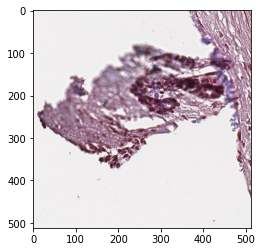

In [27]:
tileIm = cv2.imread(t)
plt.imshow(tileIm)
sample =  t.split('_')[0]
x = int(t.split('_')[1])
y = int(t.split('_')[2].split('.')[0])
xf  = int(x * .25)
yf = int(y * .25)

xm = x + 925
ym = y + 925

xmf = int(xm * 0.25)
ymf = int(ym *0.25)

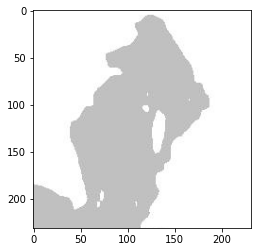

In [29]:
plt.imshow(TNE1426_fSeg[xf:xmf, yf:ymf, :])

In [ ]:
getTrain2list = os.listdir('models/research/deeplab/datasets/TumorDetection/dataset/JPEGImages')
sample = []
path2oriimg = '/data/gcs/lungNENomics/work/MathianE/FullSlidesToJpegHENormHighQuality'
for ele in getTrain2list:
    csample = ele.split('_')[0]
    if csample not in sample and csample.find('TNE') != -1:
        sample.append(csample)

In [37]:

try:
    os.mkdir('Data/FullMaskTrainset2')
except:
    print('Done')
outputdir  = 'Data/FullMaskTrainset2'
getTrain2list = os.listdir('models/research/deeplab/datasets/TumorDetection/dataset/SegmentationClass')
sample = []
path2oriimg = '/data/gcs/lungNENomics/work/MathianE/FullSlidesToJpegHENormHighQuality'
for ele in sample:
    csample = ele.split('_')[0]
    ori_im = cv2.imread(os.path.join(path2oriimg, csample + '.jpg'))
    OverlayTot = np.zeros(ori_im.shape)
    for tile in getTrain2list:
        if tile.split('_')[0]  == csample
            sub_pict = cv2.imread(os.path.join(getTrain2list,tile))
            sample_x =  int(tile.split('_')[1])
            sample_y =  int(tile.split('_')[2].split('-')[0])
            OverlayTot[sample_x:sample_x+512, 
                      sample_y:sample_y+512,] = sub_pict
            else:
                outputfname = '{}-segmap.jpg'.format(sample)
                cv2.imwrite(os.path.join(outputdir, outputfname),OverlayTot)


In [38]:
sample

['TNE0002',
 'TNE0003',
 'TNE0057',
 'TNE0360',
 'TNE0407',
 'TNE0887',
 'TNE0891',
 'TNE0893',
 'TNE0894',
 'TNE0972',
 'TNE1412',
 'TNE0882',
 'TNE2117',
 'TNE1080',
 'TNE1426',
 'TNE1425',
 'TNE1458',
 'TNE1420',
 'TNE1002',
 'TNE1418',
 'TNE1415',
 'TNE0006',
 'TNE0890',
 'TNE0866',
 'TNE1001',
 'TNE0519',
 'TNE0071',
 'TNE0798',
 'TNE1433',
 'TNE0886',
 'TNE2155',
 'TNE1082',
 'TNE0232',
 'TNE2097',
 'TNE0868',
 'TNE0970',
 'TNE0994',
 'TNE1084',
 'TNE1350',
 'TNE1438']

In [39]:
len(sample)

40

In [40]:
name = 'NL-1_22177_23101.jpg'

In [41]:
name[:-4]

'NL-1_22177_23101'